#Assignment 4 (Combining the First 3 assignments)

#Dataset
https://www.kaggle.com/datasets/miteshsingh11/dsem-33201-dataset

Questions

The following must be answered:

1. What is the question?

  I am predicting the prices(target variable y) of cab rides taken using this dataset. The dataset contains various features including the time taken, the distance covered, the type of cab taken and the weather conditions which could or could not significantly the price paid to take that cab(prospective independent variables X).

In [1]:
!pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install fitter


import csv
import json
import logging
import optparse
import os
import random
import sys
import time
from datetime import datetime
from distutils.util import strtobool

# Importing all the libararies required for the assignment
import h2o
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import pandas as pd
import psutil
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.grid.grid_search import H2OGridSearch
from matplotlib.pyplot import figure

sns.set(rc={"figure.figsize": (16, 8)})

# Model Interpretation
!pip install shap
import shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
# Reading Data into Pandas Dataframe
cab_df = pd.read_csv(
    "/content/drive/MyDrive/uberlyft.csv"
)

#Visualizing the dataset and its features

In [5]:
cab_df.isnull().sum()

id                                0
timestamp                         0
hour                              0
day                               0
month                             0
datetime                          0
timezone                          0
source                            0
destination                       0
cab_type                          0
product_id                        0
name                              0
price                          5143
distance                          0
surge_multiplier                  0
latitude                          0
longitude                         0
temperature                       0
apparentTemperature               0
short_summary                     0
long_summary                      0
precipIntensity                   0
precipProbability                 0
humidity                          0
windSpeed                         0
windGust                          0
windGustTime                      0
visibility                  

In [6]:
cab_df.shape

(65535, 57)

In [7]:
numeric_data = cab_df.select_dtypes(include=[np.number])
categorical_data = cab_df.select_dtypes(exclude=[np.number])

In [8]:
numeric_data.shape[1]

46

In [9]:
numeric_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65535 entries, 0 to 65534
Data columns (total 46 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   timestamp                    65535 non-null  float64
 1   hour                         65535 non-null  int64  
 2   day                          65535 non-null  int64  
 3   month                        65535 non-null  int64  
 4   price                        60392 non-null  float64
 5   distance                     65535 non-null  float64
 6   surge_multiplier             65535 non-null  float64
 7   latitude                     65535 non-null  float64
 8   longitude                    65535 non-null  float64
 9   temperature                  65535 non-null  float64
 10  apparentTemperature          65535 non-null  float64
 11  precipIntensity              65535 non-null  float64
 12  precipProbability            65535 non-null  float64
 13  humidity        

In [10]:
categorical_data.shape[1]

11

In [11]:
categorical_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65535 entries, 0 to 65534
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             65535 non-null  object
 1   datetime       65535 non-null  object
 2   timezone       65535 non-null  object
 3   source         65535 non-null  object
 4   destination    65535 non-null  object
 5   cab_type       65535 non-null  object
 6   product_id     65535 non-null  object
 7   name           65535 non-null  object
 8   short_summary  65535 non-null  object
 9   long_summary   65535 non-null  object
 10  icon           65535 non-null  object
dtypes: object(11)
memory usage: 5.5+ MB


In [12]:
def plot_bar(groupby_column):
    df1 = cab_df.groupby(groupby_column).size().reset_index(name="counts")
    fig1 = px.bar(data_frame=df1, x=groupby_column, y="counts", color=groupby_column, barmode="group")
    print(df1)
    fig1.show(renderer='png')

    hour  counts
0      0    3152
1      1    2736
2      2    2811
3      3    2622
4      4    2783
5      5    2391
6      6    2589
7      7    2338
8      8    2304
9      9    2833
10    10    2805
11    11    2830
12    12    2849
13    13    2772
14    14    2781
15    15    2840
16    16    2870
17    17    2797
18    18    2751
19    19    2582
20    20    2639
21    21    2642
22    22    2786
23    23    3032


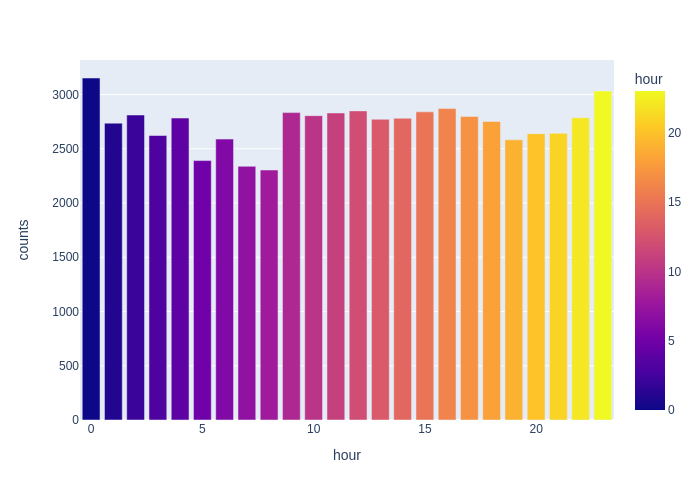

In [13]:
plot_bar('hour')

    day  counts
0     1    4153
1     2    4116
2     3    4205
3     4    1171
4     9     185
5    10     318
6    13    3680
7    14    4160
8    15    4130
9    16    4160
10   17    4095
11   18    3269
12   26    3152
13   27    7161
14   28    7338
15   29    6033
16   30    4209


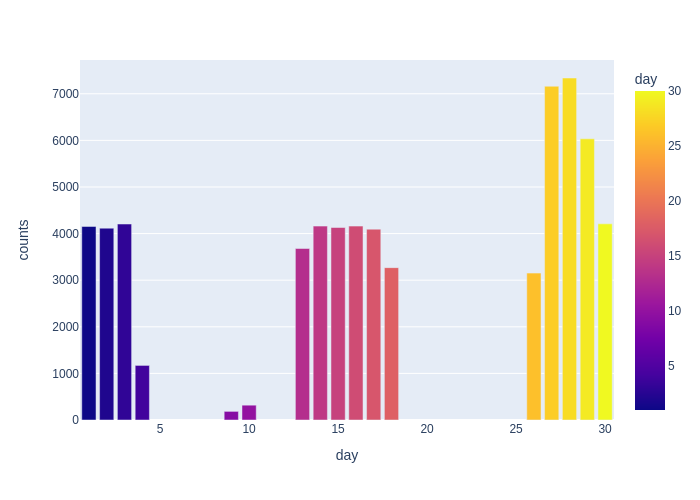

In [14]:
plot_bar('day')

   month  counts
0     11   27893
1     12   37642


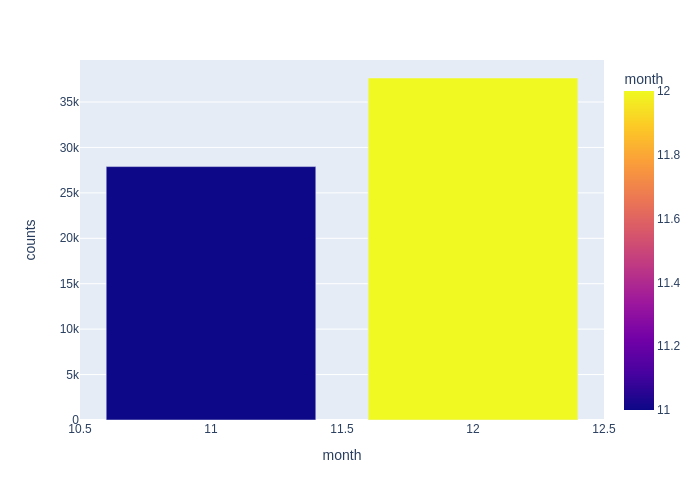

In [15]:
plot_bar('month')

                     source  counts
0                  Back Bay    5394
1               Beacon Hill    5614
2         Boston University    5267
3                    Fenway    5245
4        Financial District    5522
5          Haymarket Square    5673
6                 North End    5372
7             North Station    5399
8   Northeastern University    5474
9             South Station    5274
10         Theatre District    5707
11                 West End    5594


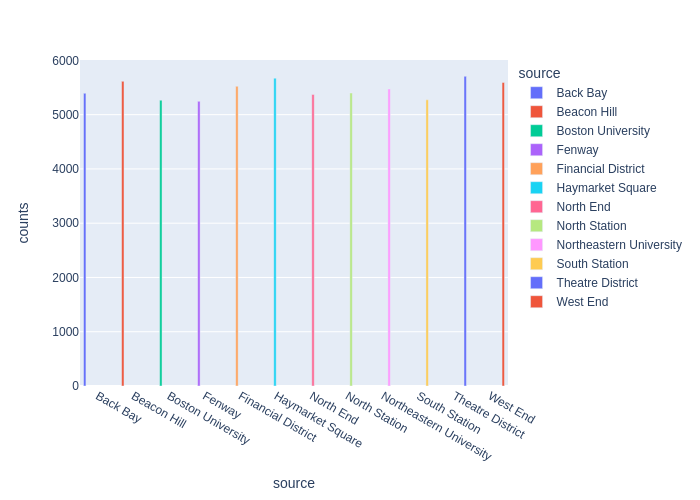

In [16]:
plot_bar('source')

                destination  counts
0                  Back Bay    5325
1               Beacon Hill    5556
2         Boston University    5591
3                    Fenway    5625
4        Financial District    5413
5          Haymarket Square    5625
6                 North End    5696
7             North Station    5402
8   Northeastern University    5770
9             South Station    4923
10         Theatre District    5560
11                 West End    5049


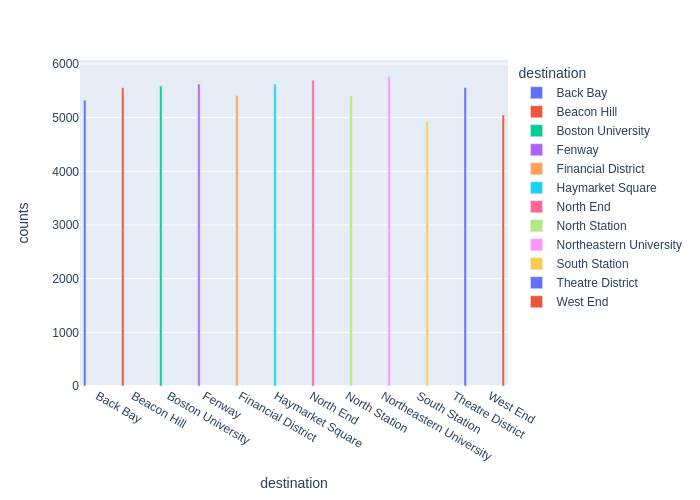

In [17]:
plot_bar('destination')

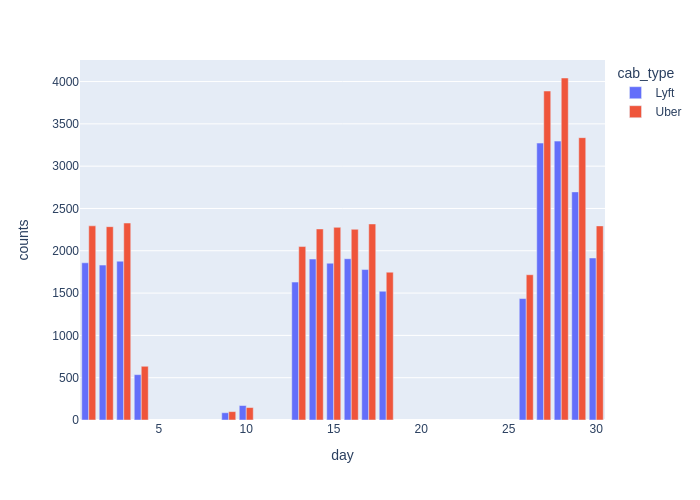

In [18]:
df2 =cab_df.groupby(by=["day","cab_type"]).size().reset_index(name="counts")
fig2 = px.bar(data_frame=df2, x="day", y="counts", color="cab_type", barmode="group")
fig2.show(renderer='png')

Checking the distribution of the numerical data in the dataset

A Q-Q plot (Quantile-Quantile plot) is used to compare the distribution of two datasets. Some of the common distributions that can be represented in a Q-Q plot are:

Normal distribution: If the points in the Q-Q plot follow a straight line, it indicates that the data follows a normal distribution.

Log-normal distribution: If the points in the Q-Q plot follow an S-shaped curve, it indicates that the data follows a log-normal distribution.

Exponential distribution: If the points in the Q-Q plot follow a downward sloping line, it indicates that the data follows an exponential distribution.

Weibull distribution: If the points in the Q-Q plot follow an upward sloping line, it indicates that the data follows a Weibull distribution.

Pareto distribution: If the points in the Q-Q plot follow a curved line, it indicates that the data follows a Pareto distribution.

Lognormal distribution: If the points in the Q-Q plot follow a U-shaped curve, it indicates that the data follows a lognormal distribution.

<Figure size 800x500 with 0 Axes>

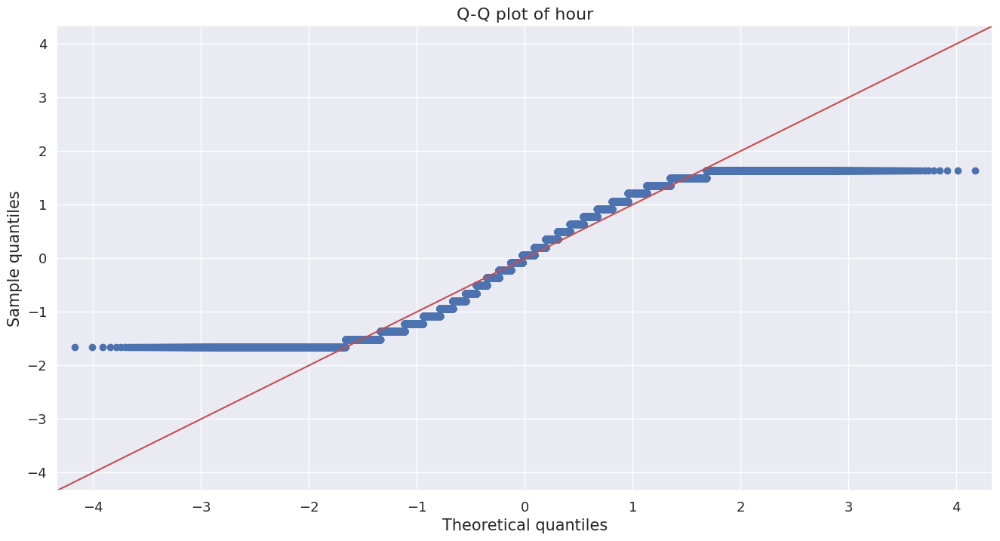

<Figure size 800x500 with 0 Axes>

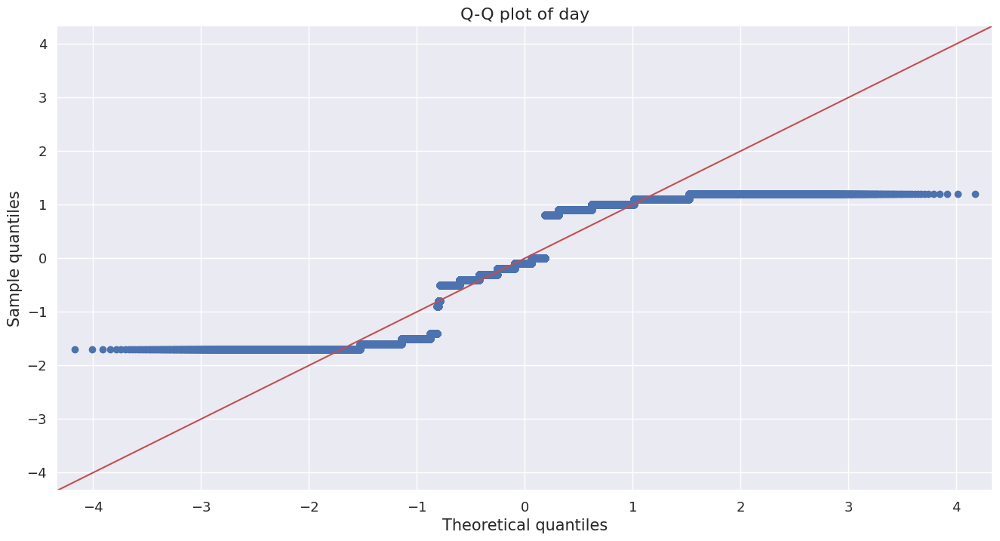

<Figure size 800x500 with 0 Axes>

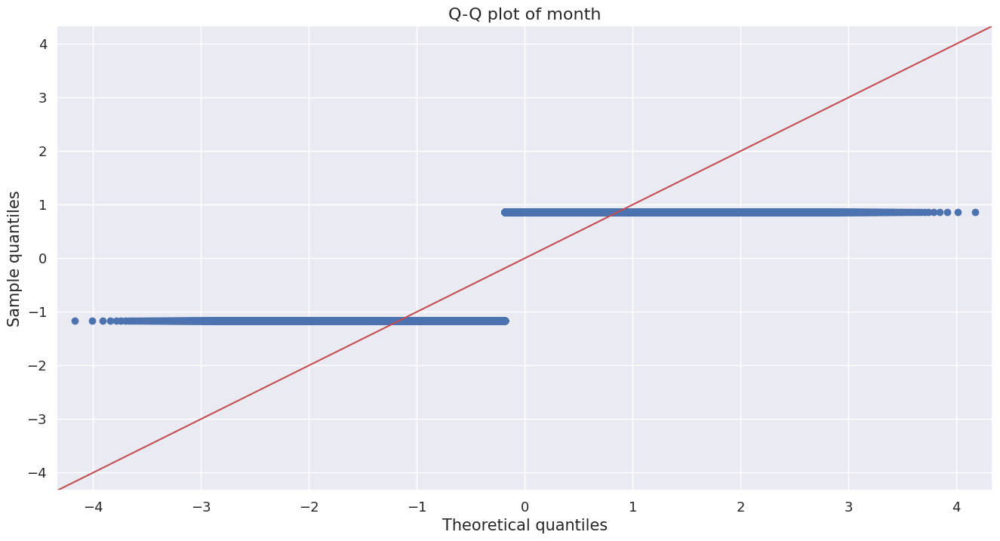

<Figure size 800x500 with 0 Axes>

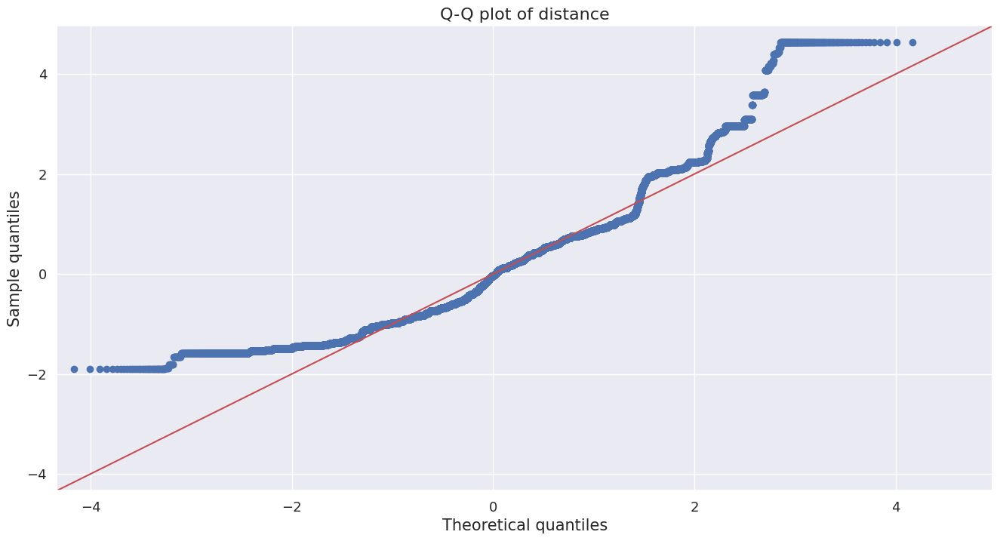

<Figure size 800x500 with 0 Axes>

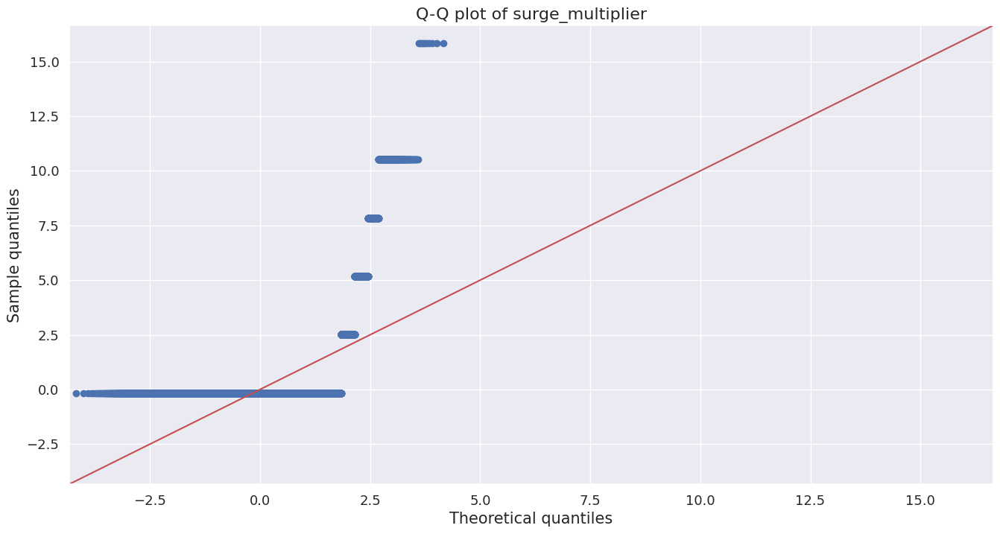

<Figure size 800x500 with 0 Axes>

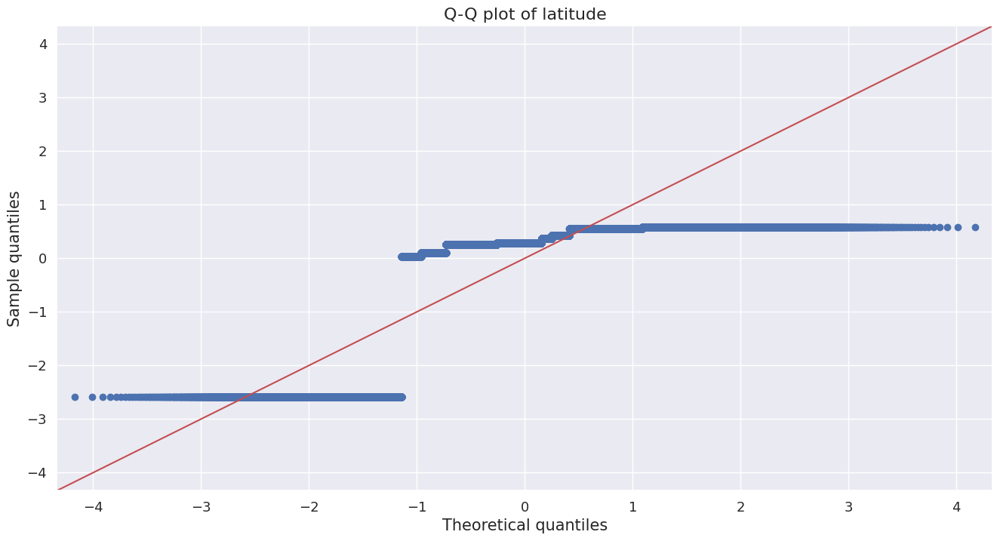

<Figure size 800x500 with 0 Axes>

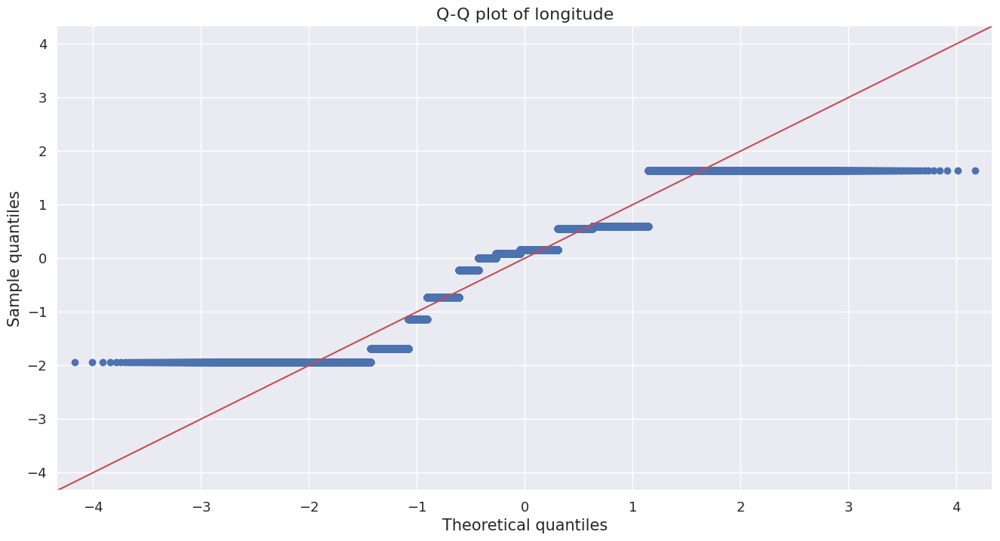

<Figure size 800x500 with 0 Axes>

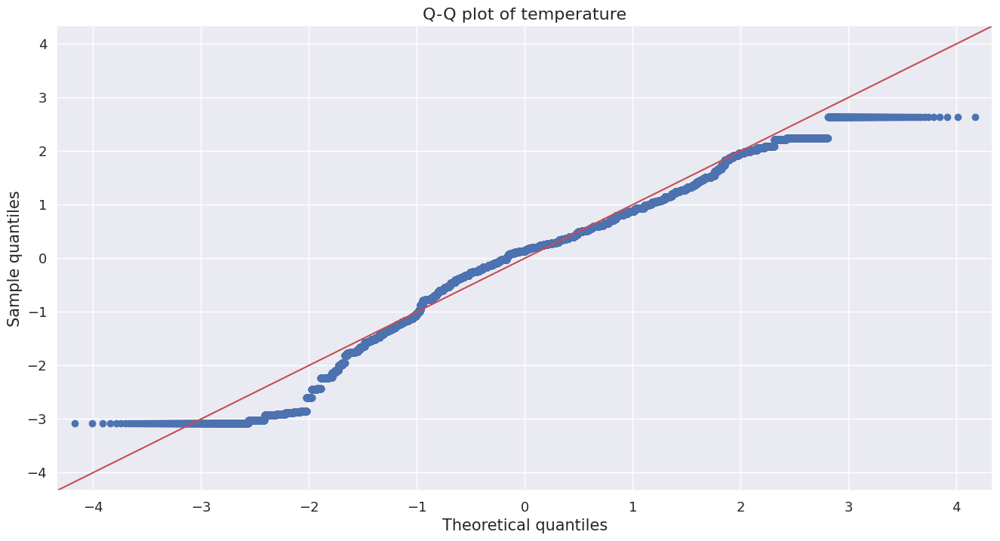

<Figure size 800x500 with 0 Axes>

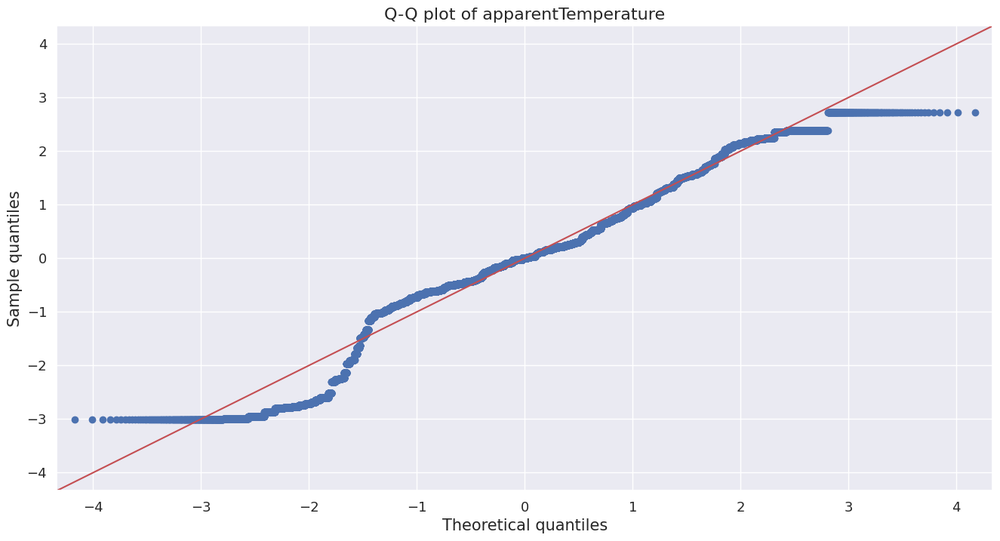

<Figure size 800x500 with 0 Axes>

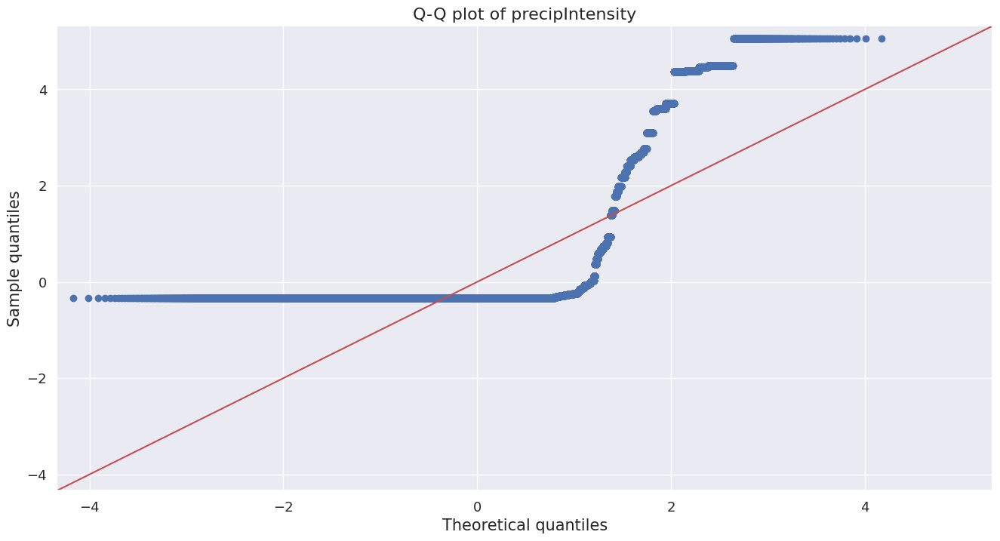

<Figure size 800x500 with 0 Axes>

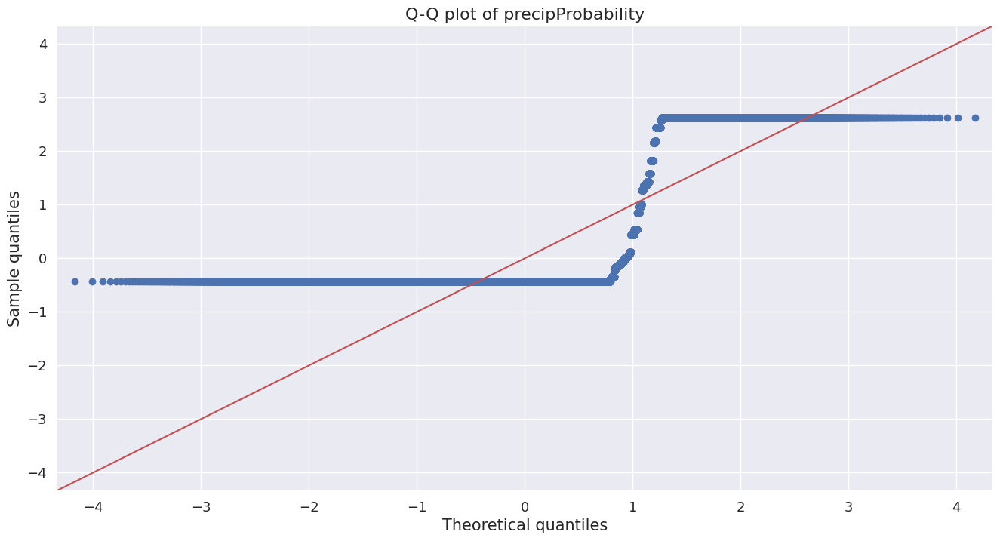

<Figure size 800x500 with 0 Axes>

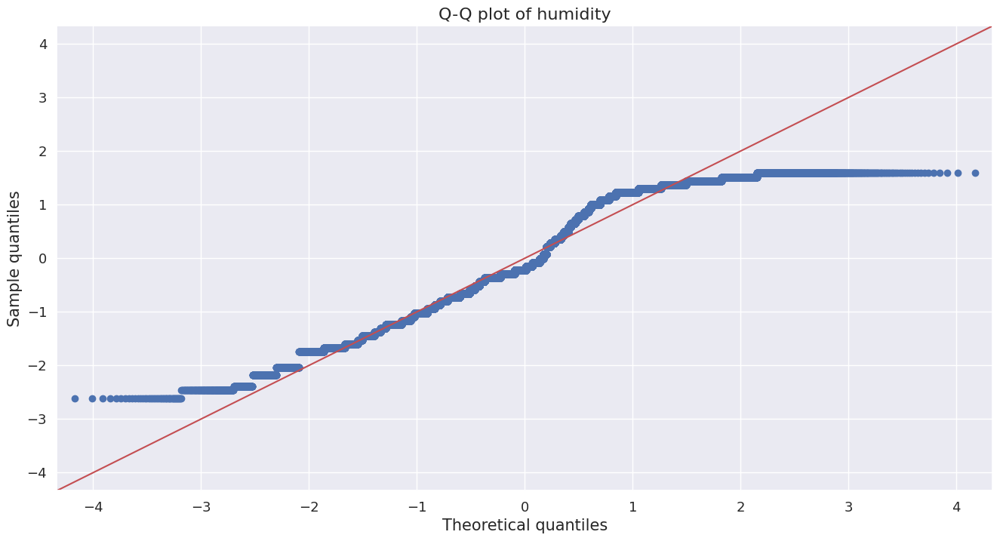

<Figure size 800x500 with 0 Axes>

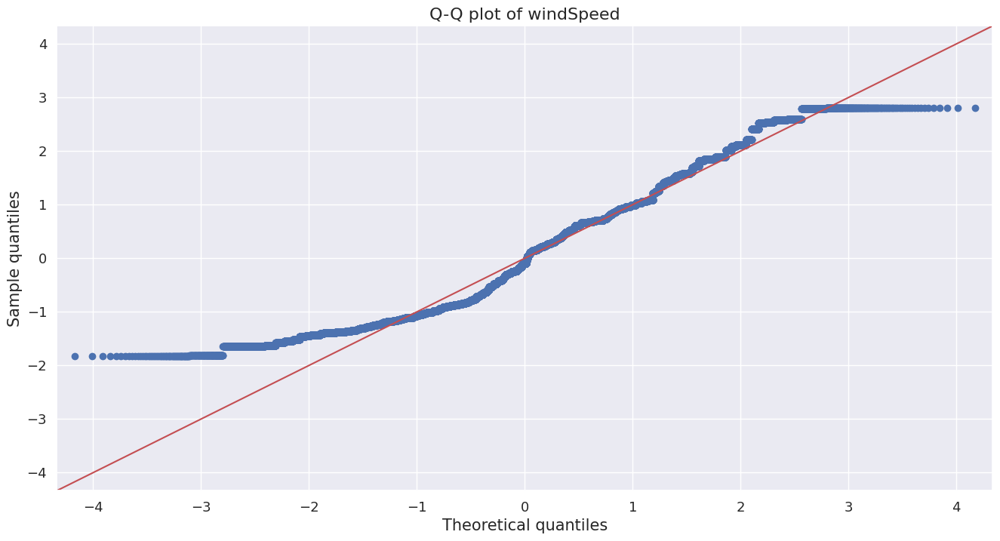

<Figure size 800x500 with 0 Axes>

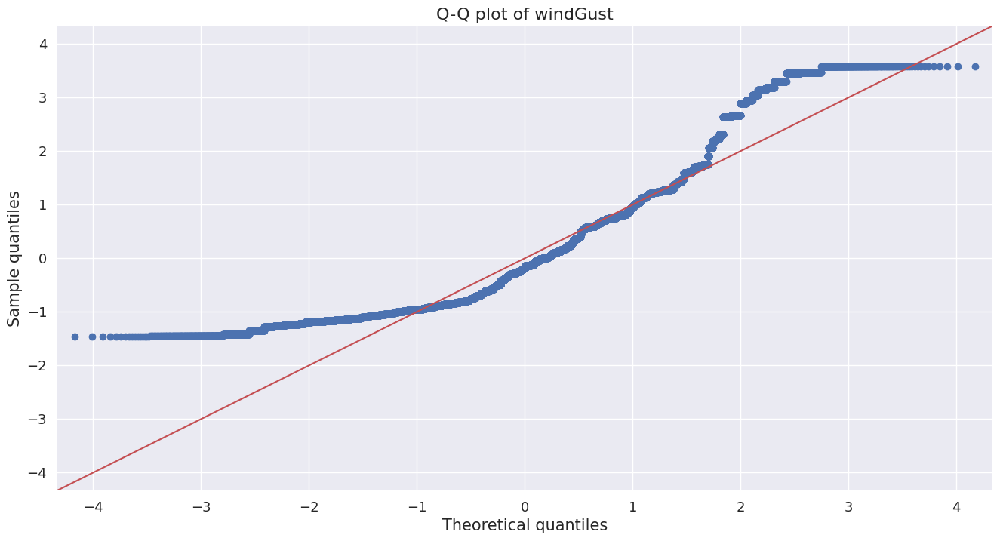

<Figure size 800x500 with 0 Axes>

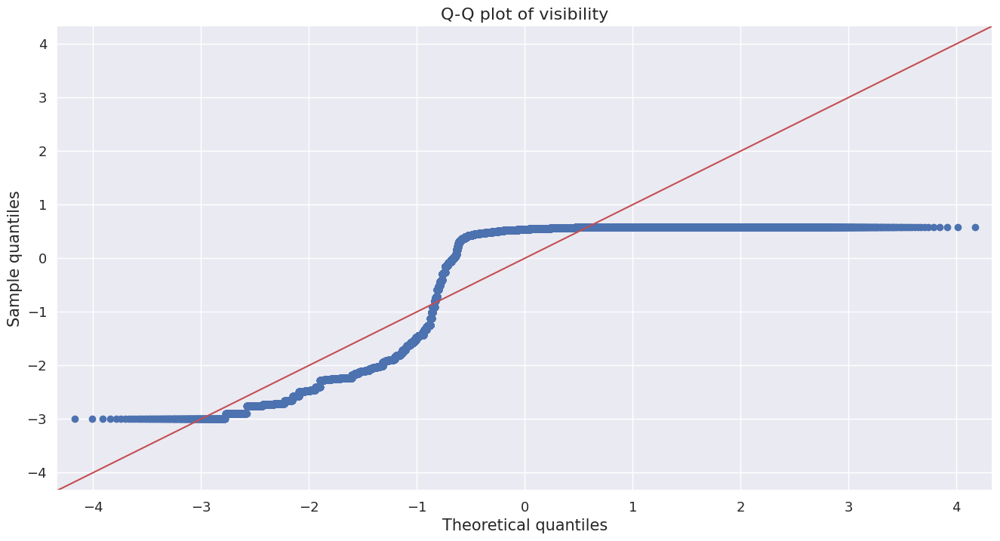

<Figure size 800x500 with 0 Axes>

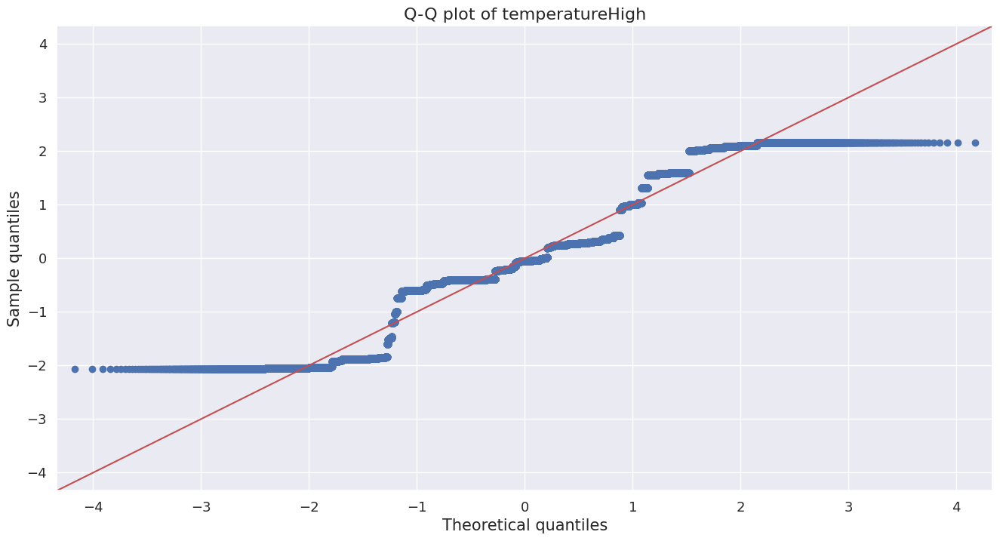

<Figure size 800x500 with 0 Axes>

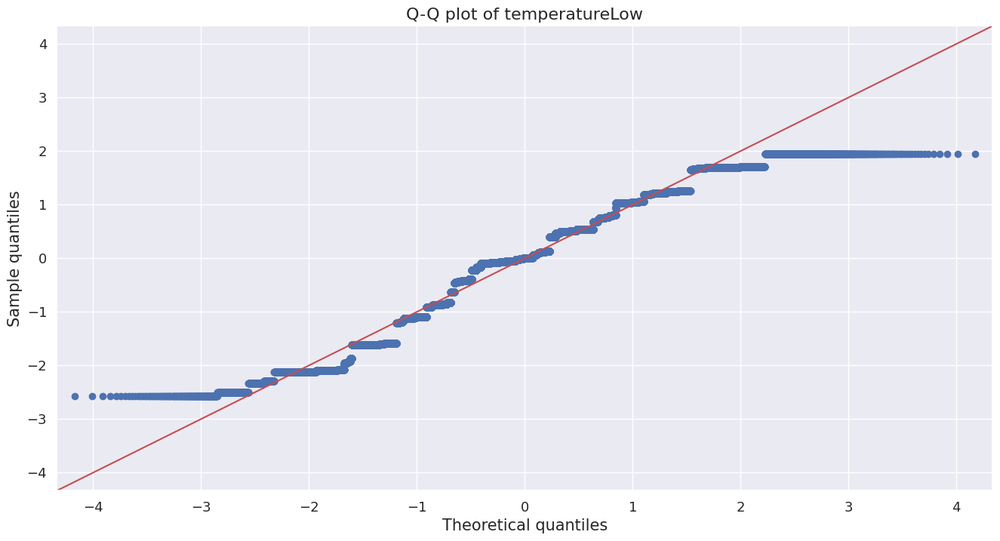

<Figure size 800x500 with 0 Axes>

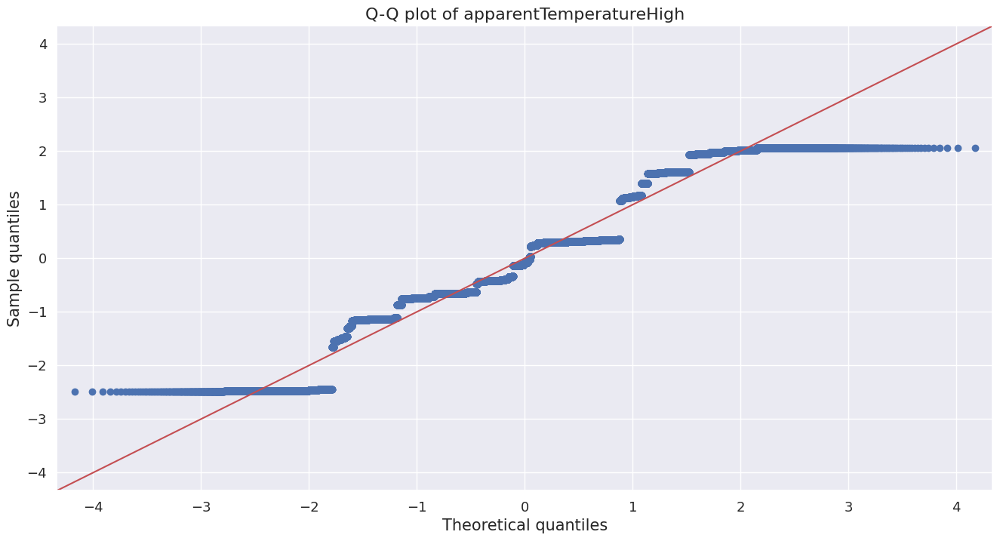

<Figure size 800x500 with 0 Axes>

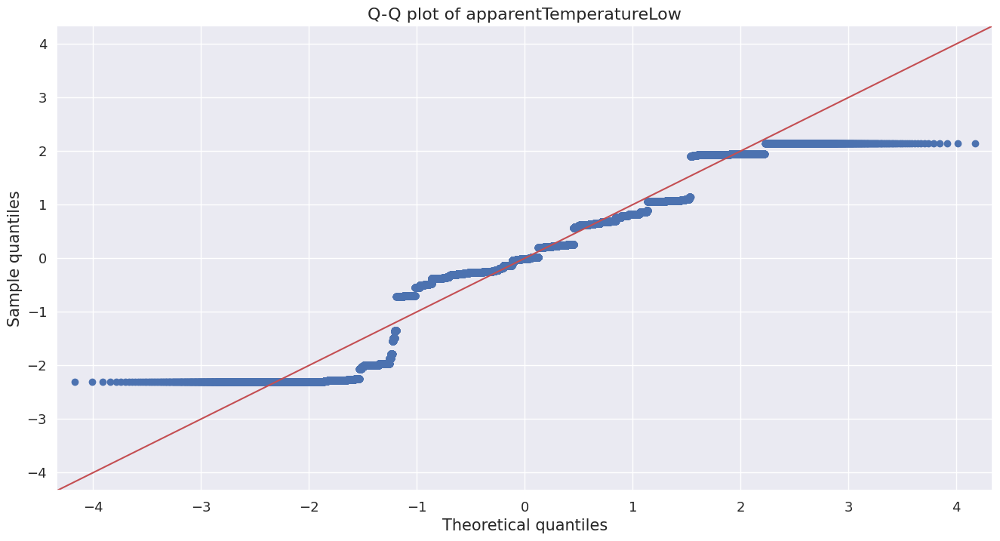

<Figure size 800x500 with 0 Axes>

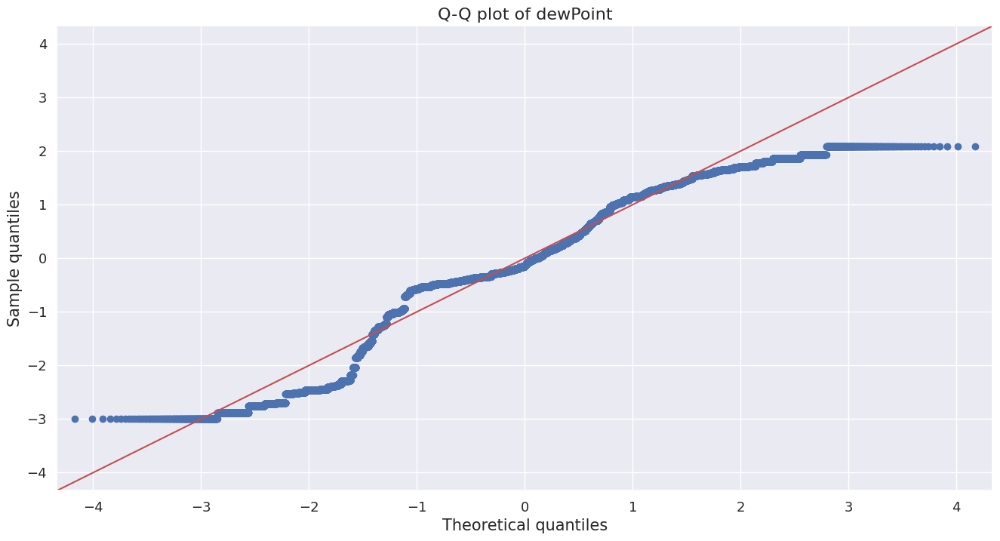

<Figure size 800x500 with 0 Axes>

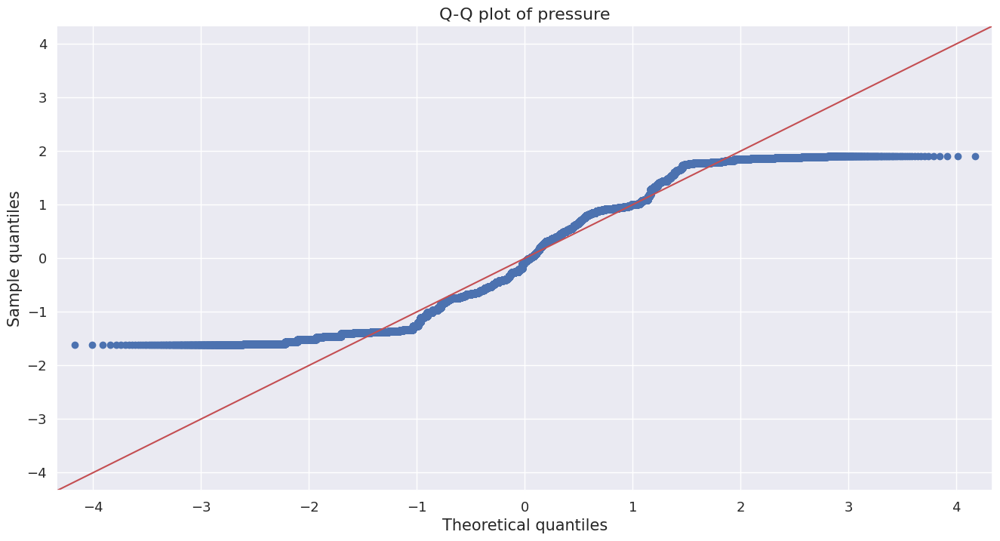

<Figure size 800x500 with 0 Axes>

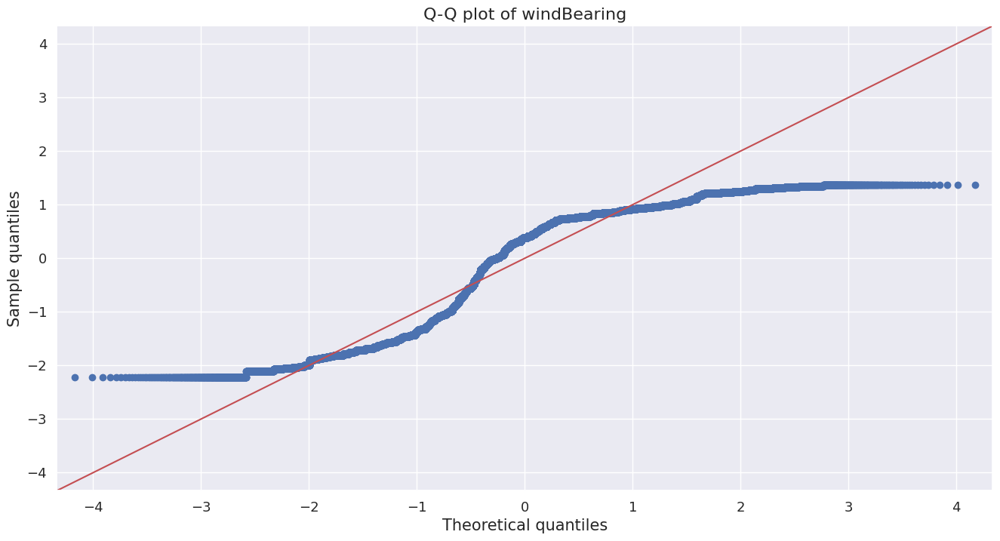

<Figure size 800x500 with 0 Axes>

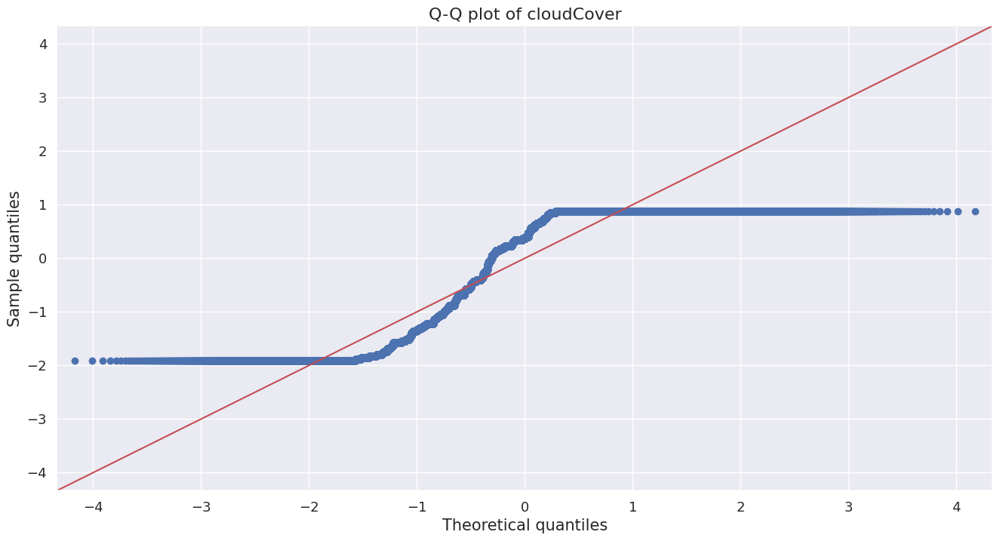

<Figure size 800x500 with 0 Axes>

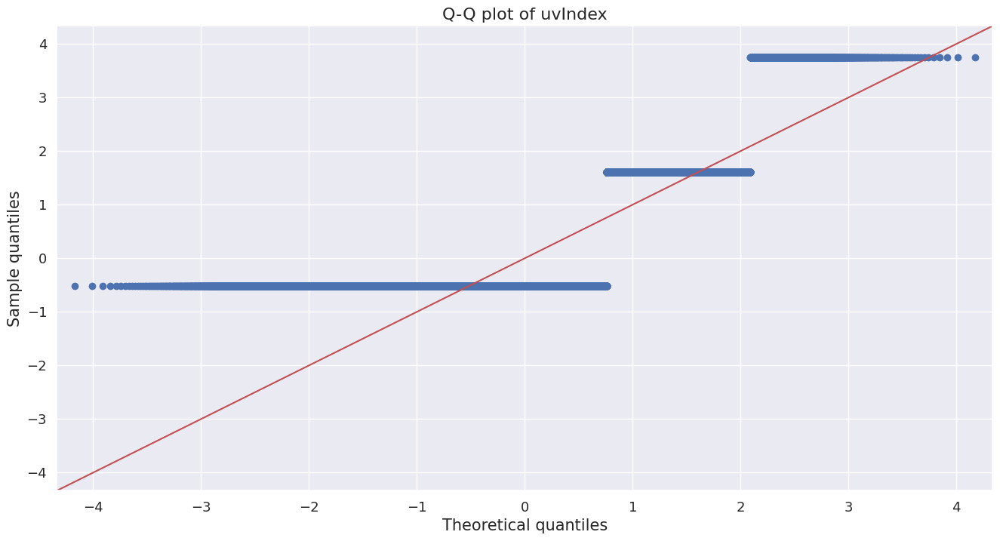

<Figure size 800x500 with 0 Axes>

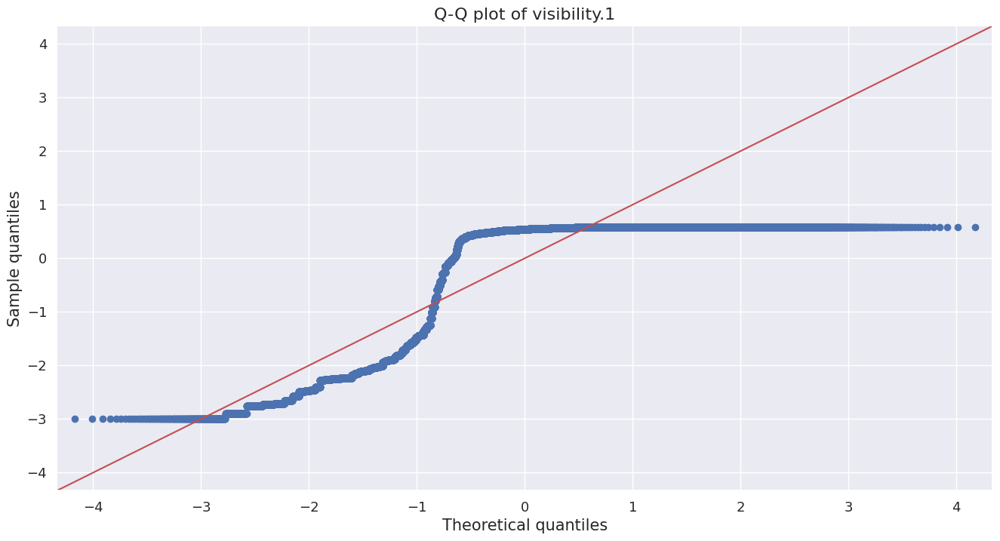

<Figure size 800x500 with 0 Axes>

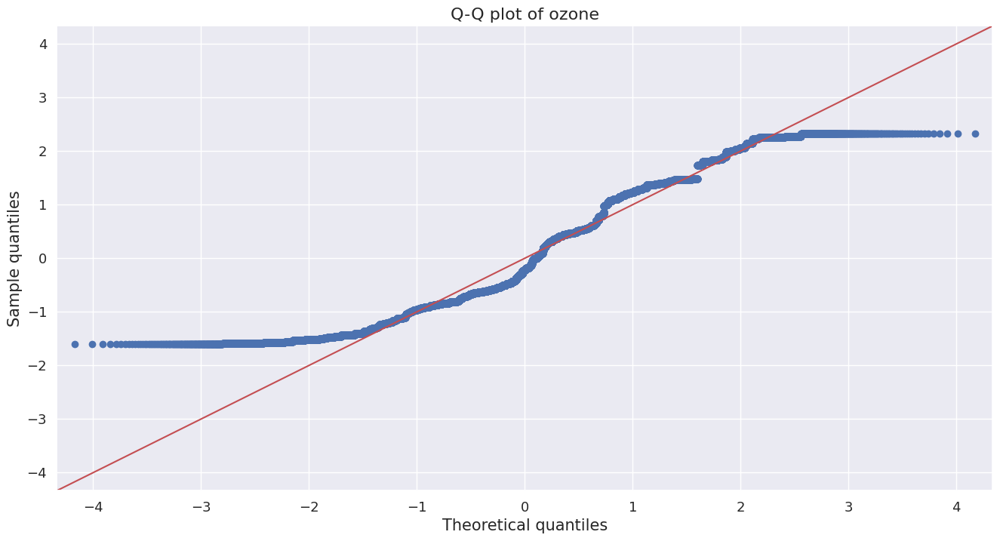

<Figure size 800x500 with 0 Axes>

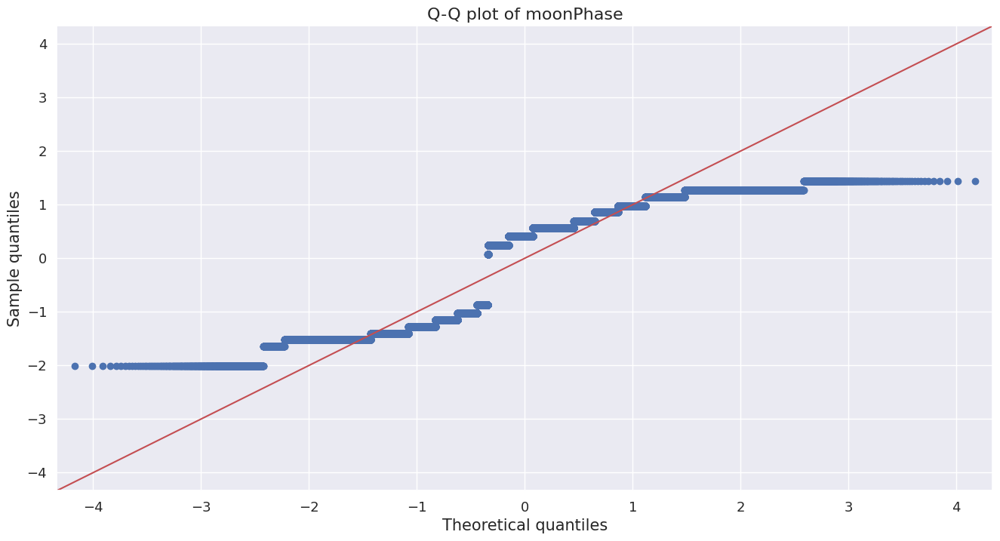

<Figure size 800x500 with 0 Axes>

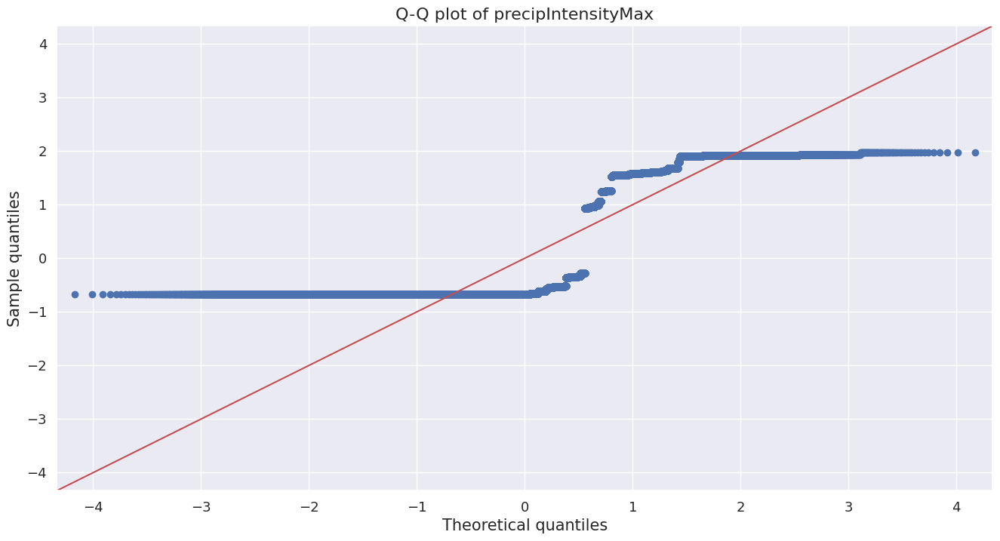

<Figure size 800x500 with 0 Axes>

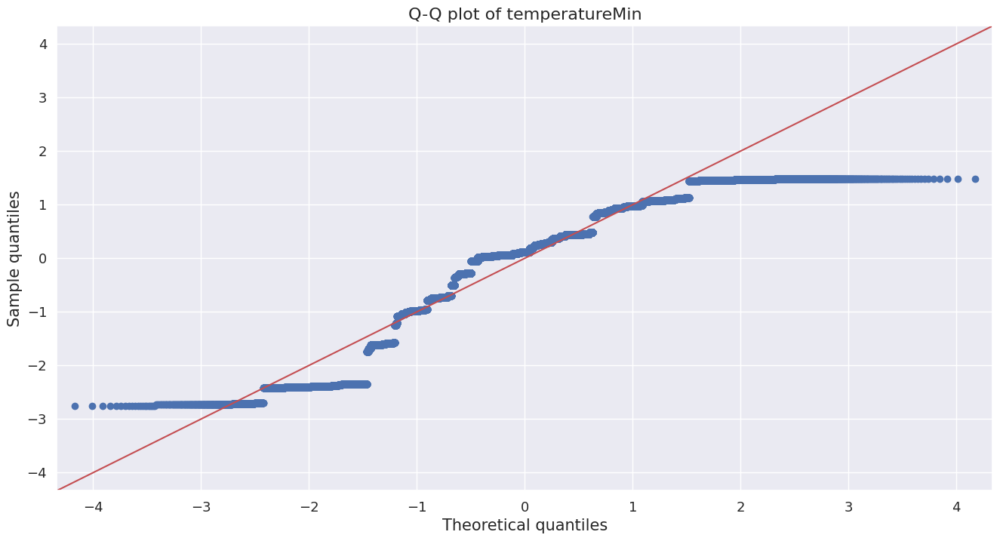

<Figure size 800x500 with 0 Axes>

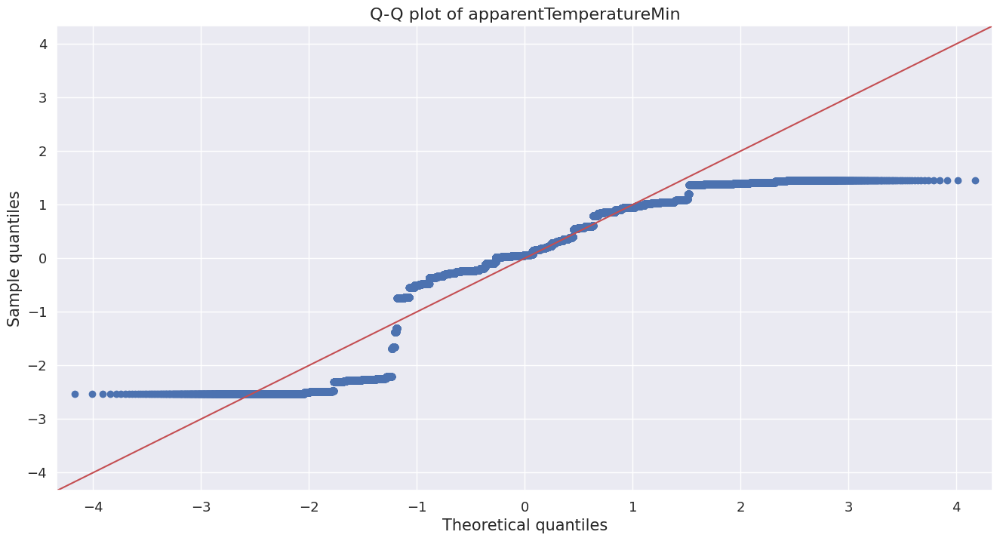

In [19]:
from statsmodels.graphics.gofplots import qqplot
data_col = numeric_data[['hour','day','month','distance','surge_multiplier','latitude','longitude','temperature','apparentTemperature','precipIntensity','precipProbability',
                         'humidity','windSpeed','windGust','visibility','temperatureHigh','temperatureLow','apparentTemperatureHigh','apparentTemperatureLow','dewPoint','pressure','windBearing','cloudCover','uvIndex'
                         ,'visibility.1','ozone','moonPhase','precipIntensityMax','temperatureMin','apparentTemperatureMin']]
for c in data_col.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_col[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

In [20]:
missing_list = cab_df.columns[cab_df.isna().any()].tolist() 
missing_count = []      
for i in missing_list:
  missing_count.append(sum(pd.isnull(cab_df[str(i)])))

d = {'Missing_Column':missing_list,'Missing_Values':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Missing"] = (Missing_DF['Missing_Values'] / cab_df.shape[0]) * 100
Missing_DF

,Missing_Column,Missing_Values,%_Missing
0,price,5143,7.847715


<Axes: >

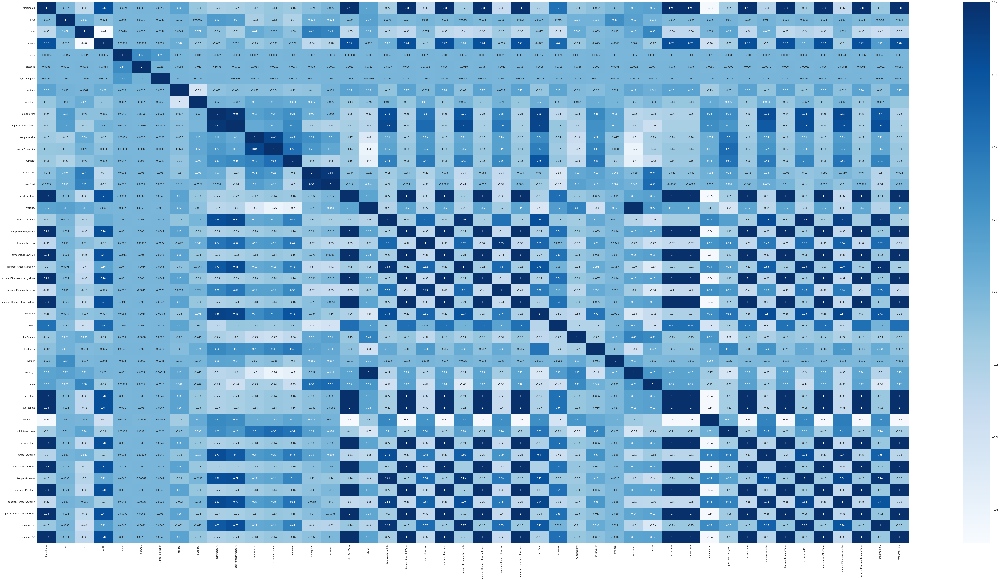

In [21]:
plt.rcParams["figure.figsize"] = (100, 50)
sns.heatmap(
    cab_df.corr(), annot=True, cmap="Blues"
)  # Heatmap showing correlation between the attributes.

#Imputation of Missing Data

In [22]:
#Mean Imputation
from sklearn.impute import SimpleImputer
df_mean = numeric_data.copy()
mean_imputer = SimpleImputer(strategy='mean')
df_mean['price'] = mean_imputer.fit_transform(df_mean['price'].values.reshape(-1,1))

In [23]:
df_mean.isnull().sum()

timestamp                      0
hour                           0
day                            0
month                          0
price                          0
distance                       0
surge_multiplier               0
latitude                       0
longitude                      0
temperature                    0
apparentTemperature            0
precipIntensity                0
precipProbability              0
humidity                       0
windSpeed                      0
windGust                       0
windGustTime                   0
visibility                     0
temperatureHigh                0
temperatureHighTime            0
temperatureLow                 0
temperatureLowTime             0
apparentTemperatureHigh        0
apparentTemperatureHighTime    0
apparentTemperatureLow         0
apparentTemperatureLowTime     0
dewPoint                       0
pressure                       0
windBearing                    0
cloudCover                     0
uvIndex   

In [24]:
# Mode Imputation

df_mode = numeric_data.copy()
mode_imputer = SimpleImputer(strategy='most_frequent')
df_mode['price'] = mode_imputer.fit_transform(df_mode['price'].values.reshape(-1,1))

In [25]:
df_mode.isnull().sum()

timestamp                      0
hour                           0
day                            0
month                          0
price                          0
distance                       0
surge_multiplier               0
latitude                       0
longitude                      0
temperature                    0
apparentTemperature            0
precipIntensity                0
precipProbability              0
humidity                       0
windSpeed                      0
windGust                       0
windGustTime                   0
visibility                     0
temperatureHigh                0
temperatureHighTime            0
temperatureLow                 0
temperatureLowTime             0
apparentTemperatureHigh        0
apparentTemperatureHighTime    0
apparentTemperatureLow         0
apparentTemperatureLowTime     0
dewPoint                       0
pressure                       0
windBearing                    0
cloudCover                     0
uvIndex   

In [26]:
#Imputing with KNN

from sklearn.impute import KNNImputer

#Define a subset of the dataset
df_knn = numeric_data.filter(['distance','surge_multiplier','price'], axis=1).copy()


# Define KNN imputer and fill missing values
knn_imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
df_knn_imputed = pd.DataFrame(knn_imputer.fit_transform(df_knn), columns=df_knn.columns)

In [27]:
df_knn_imputed.isnull().sum()

distance            0
surge_multiplier    0
price               0
dtype: int64

Text(0.5, 0, 'price')

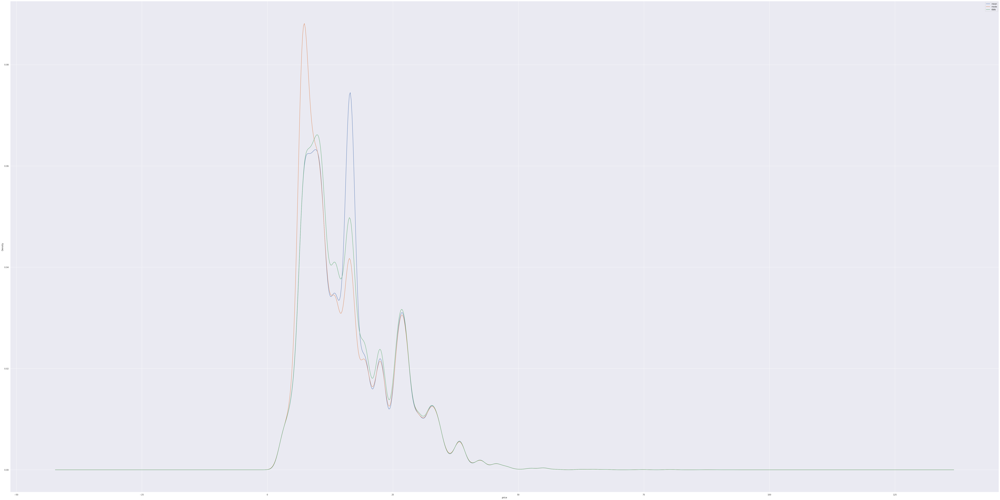

In [28]:
df_mean.price.plot(kind="kde")
df_mode.price.plot(kind="kde")
df_knn_imputed.price.plot(kind="kde")
plt.legend(["mean", "mode", "KNN"])
plt.xlabel("price")

In [29]:
pd.options.mode.chained_assignment = None  
numeric_data.drop(['price'], axis=1, inplace=True)

numeric_data['price'] = df_knn_imputed['price']

#Feature Importance and Selection

In this step, we are analyzing how the different features are affecting the price of a cab ride

In [30]:
data_viz = numeric_data[['hour','day','month','distance','surge_multiplier','price','latitude','longitude','temperature','apparentTemperature','precipIntensity','precipProbability',
                         'humidity','windSpeed','windGust','visibility','temperatureHigh','temperatureLow','apparentTemperatureHigh','apparentTemperatureLow','dewPoint','pressure','windBearing','cloudCover','uvIndex'
                         ,'visibility.1','ozone','moonPhase','precipIntensityMax','temperatureMin','apparentTemperatureMin']]

Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients of the dataset


In [31]:
df = data_viz.drop(["price"], axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, data_viz.price), 1)

<ipython-input-31-0726094c4b2c>:3: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.



#OLS regression summary



OLS (Ordinary Least Squares) regression is a linear regression model that minimizes the sum of squared errors between the predicted and actual values. It is a popular method for modeling the relationship between a dependent variable and one or more independent variables.



In [32]:
import statsmodels.formula.api as smf  # OLS model Library

results = smf.ols(
    formula = "price ~ hour + day + month + distance + surge_multiplier + latitude + longitude + temperature + apparentTemperature + precipIntensity + precipProbability + humidity + windSpeed + windGust + visibility + temperatureHigh + temperatureLow + apparentTemperatureHigh + apparentTemperatureLow + dewPoint + pressure + windBearing + cloudCover + uvIndex +  ozone + moonPhase + precipIntensityMax + temperatureMin + apparentTemperatureMin ",
    data=df_norm,
).fit()
print(results.summary()) 

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                     505.3
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        03:41:46   Log-Likelihood:            -2.3076e+05
No. Observations:               65535   AIC:                         4.616e+05
Df Residuals:                   65505   BIC:                         4.619e+05
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

#Feature Selection

Feature Selection is the process of selecting the features which are relevant to a machine learning model. It means that you select only those attributes that have a significant effect on the model's output.

#Null-Hypothesis

A null hypothesis is a statement or assumption that there is no significant difference between two or more groups, variables, or conditions being compared in a statistical analysis. It is usually the default position or starting point in a hypothesis test, which is used to determine whether there is enough evidence to reject or fail to reject the null hypothesis.

Statistically, this can be achieved by P-Value.

P-Value - It stands for probability value ; it tells how likely it is that a result occurred by chance alone. Basically, the p-value is used in hypothesis testing to help you support or reject the null hypothesis. The smaller the p-value, the stronger the evidence to reject the null hypothesis.

Features in our dataset with P value < 0.05

distance

surge_multiplier

Lets consider only these features and calculate the model fit again, and then lets have a comparative analysis of both models.

In [33]:
df_norm_feature_selected = df_norm[
    [
        "distance",
        "surge_multiplier",
        "price"
    ]
]

In [34]:
results2 = smf.ols(
    "price ~ distance + surge_multiplier",
    data=df_norm_feature_selected,
).fit()
print(results2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.182
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                     7314.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        03:41:46   Log-Likelihood:            -2.3078e+05
No. Observations:               65535   AIC:                         4.616e+05
Df Residuals:                   65532   BIC:                         4.616e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           10.1599      0.069  

This block of code is a function that takes numbers l1 and l2, l1 being the predicted value and l2 being the actual value  and calculates the percentage change between corresponding elements in the two lists. The function returns the average percentage change across all predicted and actual values.

In [35]:
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [36]:
predicted_price_1 = results.predict(
    df_norm[
        [
            'hour','day','month','distance','surge_multiplier','latitude','longitude','temperature','apparentTemperature','precipIntensity','precipProbability',
                         'humidity','windSpeed','windGust','visibility','temperatureHigh','temperatureLow','apparentTemperatureHigh','apparentTemperatureLow','dewPoint','pressure','windBearing','cloudCover','uvIndex'
                         ,'visibility.1','ozone','moonPhase','precipIntensityMax','temperatureMin','apparentTemperatureMin'
        ]
    ]
)
df_norm["predicted_price_1"] = predicted_price_1.round()

In [37]:
predicted_price_2 = results2.predict(
    df_norm_feature_selected[
        [
            "distance",
            "surge_multiplier"
        ]
    ]
)
df_norm_feature_selected["predicted_price_2"] = predicted_price_2.round()

In [38]:
print(
    "Accuracy of predicting the correct price using all features = ",
    100 - percentage_change(df_norm["price"], df_norm["predicted_price_1"]),
)
print(
    "Accuracy of predicting the correct price using only significant features is = ",
    100
    - percentage_change(
        df_norm_feature_selected["price"],
        df_norm_feature_selected["predicted_price_2"],
    ),
)

Accuracy of predicting the correct price using all features =  46.867387538033434
Accuracy of predicting the correct price using only significant features is =  46.86053219825044



*   From the above two summaries we can interpret that after selecting only the significant features(features with P value less than 0.05) it had little to no effect on the outcome compare to the model which uses all the features.
*   Model who uses all features only slightly better performs better than the model who is using only the statistically important features with and accuracy of 46.867% compared to the 46.860 % of the latter
*   We will use different approaches and try using different models








In [39]:
df_norm = df_norm.drop(["predicted_price_1"], axis=1)

#Building a Linear and Random Forest Model
*   The data was split into Training and Testing sets(80% and 20% respectively).




In [40]:
from sklearn.model_selection import train_test_split

In [41]:
X = df_norm.drop(["price"], axis=1)  # Training Feature
Y = df_norm["price"]  # Target

In [42]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.2, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

#Linear Regression

In [43]:
import sklearn
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)

LinearRegression()

In [44]:
y_pred=linear_model.predict(x_test)

In [45]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.1800547578514904

In [46]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test,y_pred)
rmse = np.sqrt(mse)
print(mse)
print(rmse)

66.68310098780859
8.165972139788906


In [47]:
y_linear_predictions = linear_model.predict(x_test).round()

#Random Forest Regression

In [48]:
from sklearn.ensemble import RandomForestRegressor
import graphviz

tree_model = RandomForestRegressor(
    max_depth=X.shape[1], random_state=0, n_estimators=10
)
tree_model.fit(x_train, y_train)


RandomForestRegressor(max_depth=30, n_estimators=10, random_state=0)

In [49]:
y_tree_based_predictions = tree_model.predict(x_test).round()

In [50]:
from sklearn.metrics import r2_score
r2_score(y_test, y_tree_based_predictions)

-0.08821061598434055

In [51]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test,y_tree_based_predictions)
rmse = np.sqrt(mse)
print(mse)
print(rmse)

88.50012741283282
9.407450633026613


#Setting up AutoML

To perform AutoML, we are using the H20.ai platform

H2O.ai is an open-source AutoML platform that provides a range of machine learning algorithms and tools to help automate the process of building accurate and scalable models. H2O.ai supports a variety of machine learning tasks, including classification, regression, clustering, and anomaly detection.

One of the key features of H2O.ai is its ability to automatically perform feature engineering, which involves selecting and transforming input variables to improve model performance. H2O.ai uses a technique called "AutoFeature" to automatically generate new features based on the input data, which can improve the accuracy of the model without requiring manual feature engineering.

Another important feature of H2O.ai is its ability to perform hyperparameter tuning, which involves finding the optimal values for the parameters that control the behavior of the machine learning algorithm. H2O.ai uses a technique called "AutoML" to automatically search for the best combination of hyperparameters for a given task, which can greatly improve the performance of the model.

In [52]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [53]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

3


In [54]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:30787..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmppde18_d0
  JVM stdout: /tmp/tmppde18_d0/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmppde18_d0/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:30787
Connecting to H2O server at http://127.0.0.1:30787 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_06gm5k
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


#Using AutoML to find out the best Model

In [55]:
data_hf = h2o.H2OFrame(data_viz)  

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [56]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = data_hf.split_frame([pct_rows])

In [57]:
 # Setting up AutoML
def autoML(df_train, df_test):

    X = df_train.columns
    y = "price"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m and "GBM" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [58]:
autoML = autoML(df_train, df_test)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [59]:
autoML[2].leaderboard 

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_34207,8.2312,67.7527,6.64919,0.488629,67.7527
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_34207,8.2317,67.7609,6.65388,0.488706,67.7609
StackedEnsemble_AllModels_1_AutoML_1_20230410_34207,8.23336,67.7882,6.65098,0.488742,67.7882
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_34207,8.23394,67.7977,6.64988,0.488731,67.7977
StackedEnsemble_AllModels_2_AutoML_1_20230410_34207,8.23462,67.8089,6.65537,0.488831,67.8089
StackedEnsemble_AllModels_3_AutoML_1_20230410_34207,8.23553,67.8239,6.64748,0.488659,67.8239
GLM_1_AutoML_1_20230410_34207,8.24506,67.981,6.66338,0.488928,67.981
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_34207,8.2465,68.0047,6.66229,0.489187,68.0047
GBM_grid_1_AutoML_1_20230410_34207_model_2,8.25319,68.1151,6.65974,0.489334,68.1151
GBM_grid_1_AutoML_1_20230410_34207_model_9,8.257,68.1781,6.67237,0.490416,68.1781


In [60]:
autoML_model = getBestModel(autoML[2]) 

6


In [61]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

6
Model Details
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_1_AutoML_1_20230410_34207


GLM Model: summary
    family    link      regularization               lambda_search                                                                number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------  ---------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------------------------------------
    gaussian  identity  Ridge ( lambda = 0.005518 )  nlambda = 30, lambda.max = 316.55, lambda.min = 0.005518, lambda.1se = -1.0  30                            30                             24                      AutoML_1_20230410_34207_training_py_2_sid_bf36

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 66.87043392934197
RMSE: 8.17743443442636

In [62]:
autoML_best_predictions = autoML_model.predict(df_test).round()

glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [63]:
autoMLpredictions = h2o.as_list(autoML_best_predictions, use_pandas=False)
y_test_h2O = h2o.as_list(df_test["price"], use_pandas=False)


In [64]:
def flatten(t):
    listt = [(item) for sublist in t for item in sublist][1:]
    listt = [float(x) for x in listt]
    x = pd.Series(listt)
    return x

In [65]:
autoMLpredictions = flatten(autoMLpredictions)
y_test_h2O = flatten(y_test_h2O)

Now, using the percentage change function this block code will compare the accuracy of the three different approaches we have used to build a machine learning model to predict the price which is our target variable. 

In [66]:
print(
    "Accuracy of predicting the correct price using Linear Model = ",
    100 - percentage_change(y_test, y_linear_predictions),
)
print(
    "Accuracy of predicting the correct price using Tree Based Model = ",
    100 - percentage_change(y_test, y_tree_based_predictions),
)
print(
    "Accuracy of predicting the correct price using best AutoML model = ",
    100 - percentage_change(y_test_h2O, autoMLpredictions),
)

Accuracy of predicting the correct price using Linear Model =  47.42592093793439
Accuracy of predicting the correct price using Tree Based Model =  41.8982325670537
Accuracy of predicting the correct price using best AutoML model =  46.861429484755256


#Model Selection and SHAP analysis (Linear Model)

From the above summary of the models trained on the dataset, AutoML and Linear Regression are the best performing models.

Let's try to understand how both the models have been trained.

Interpreting SVM Regressor using SHAP values




*   In this step we are the doing the shap analysis for the dataset and it should be noted that I have taken only 100 samples from the dataset to perform the visualizations as shap is a computationally expensive process



SHAP

In [67]:
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train_100)

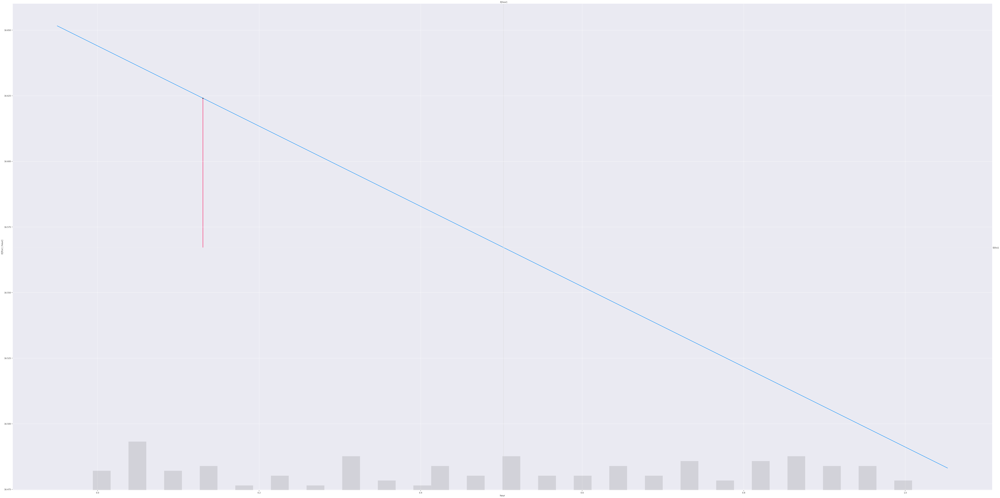

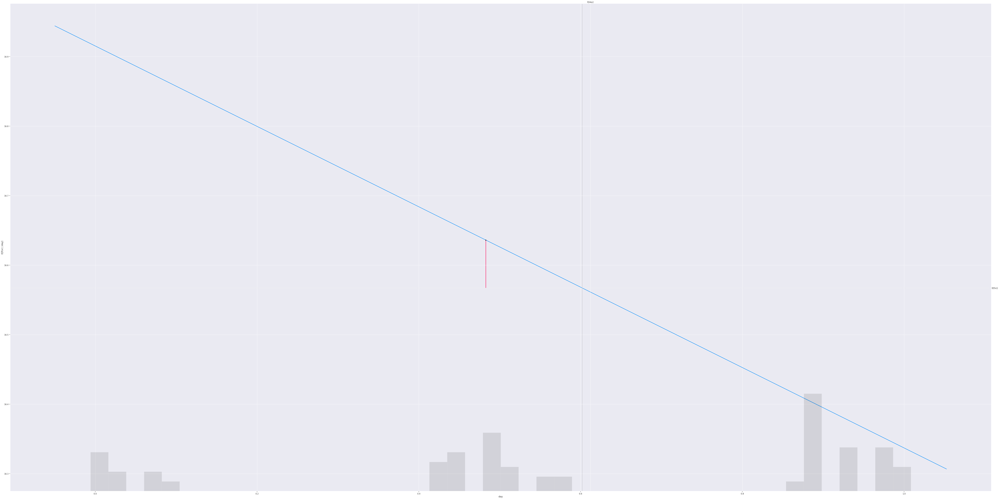

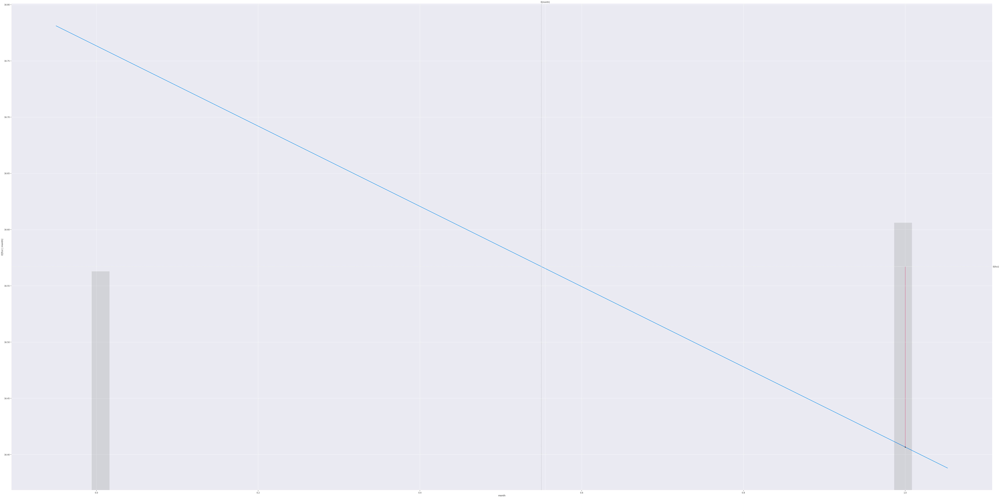

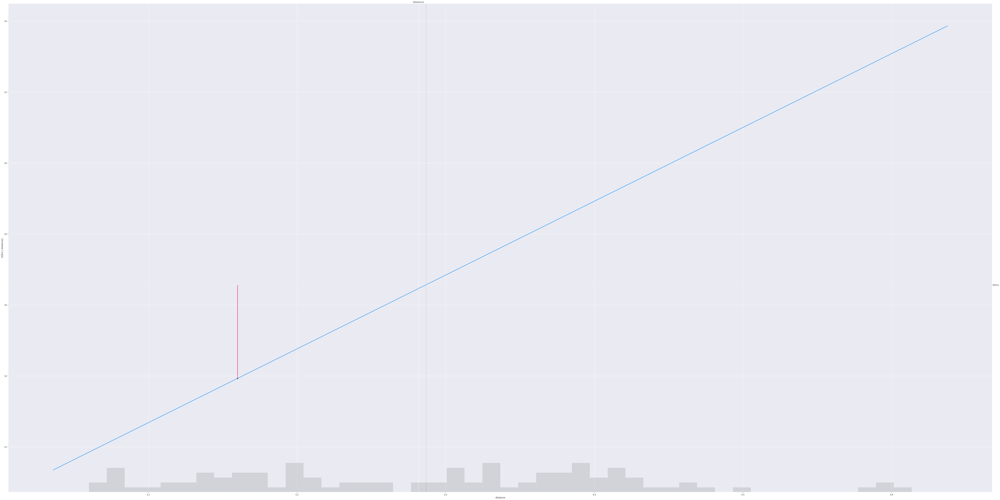

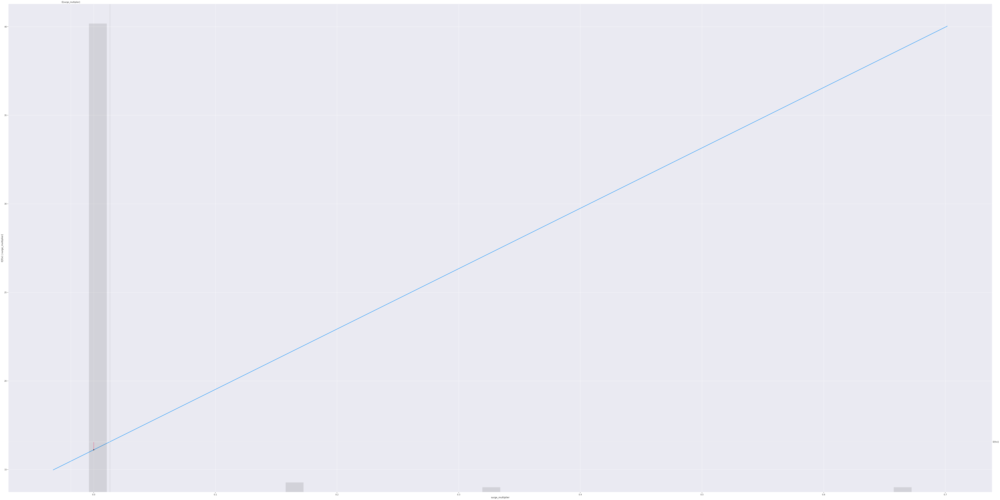

...

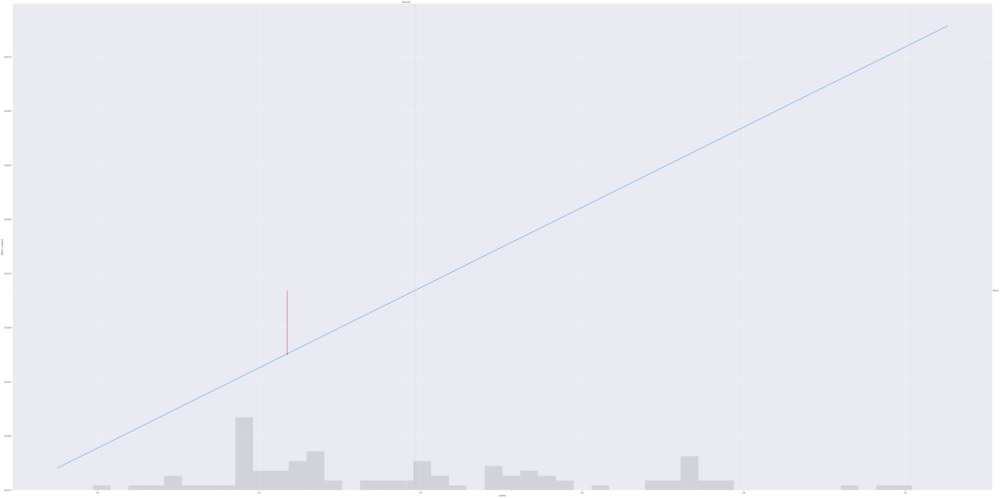

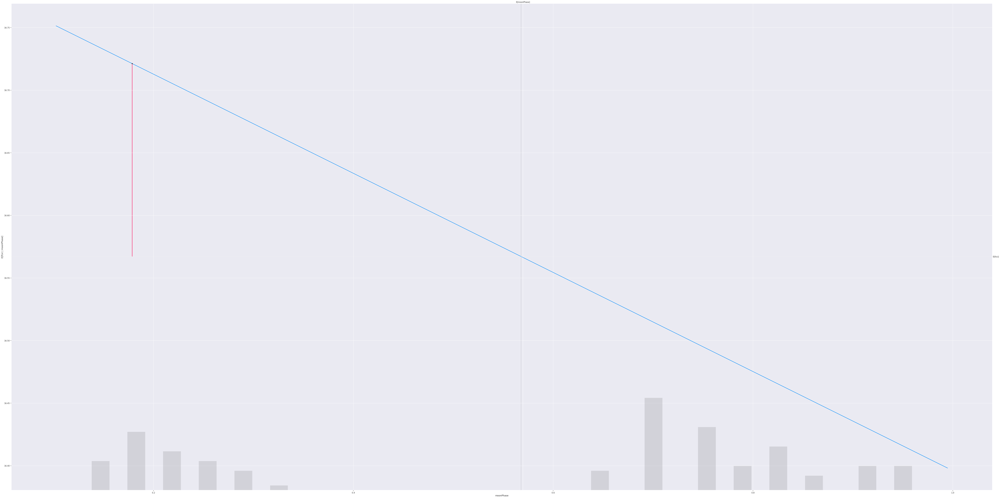

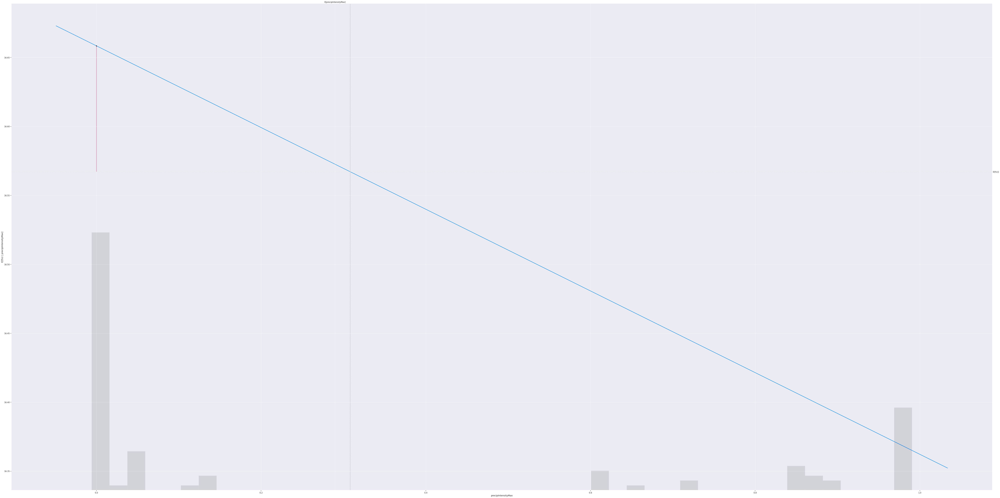

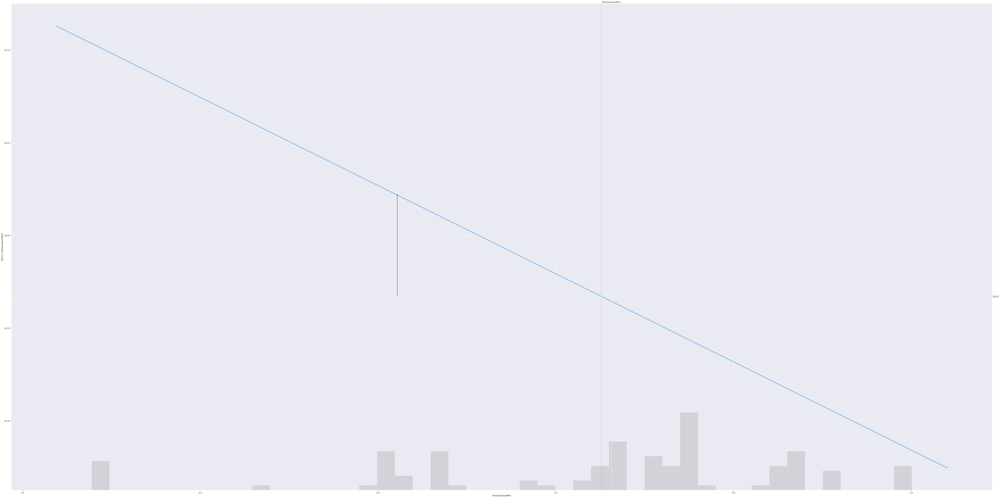

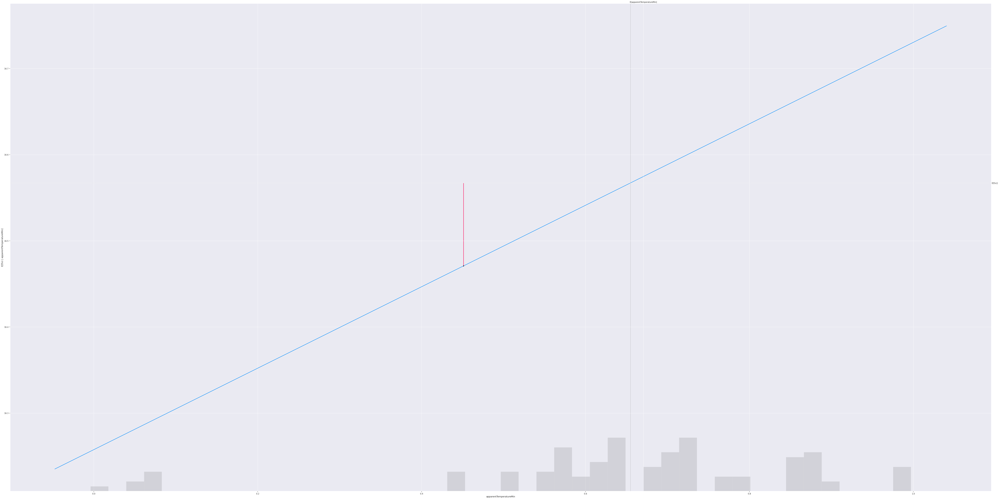

In [68]:
for i in x_train_100.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

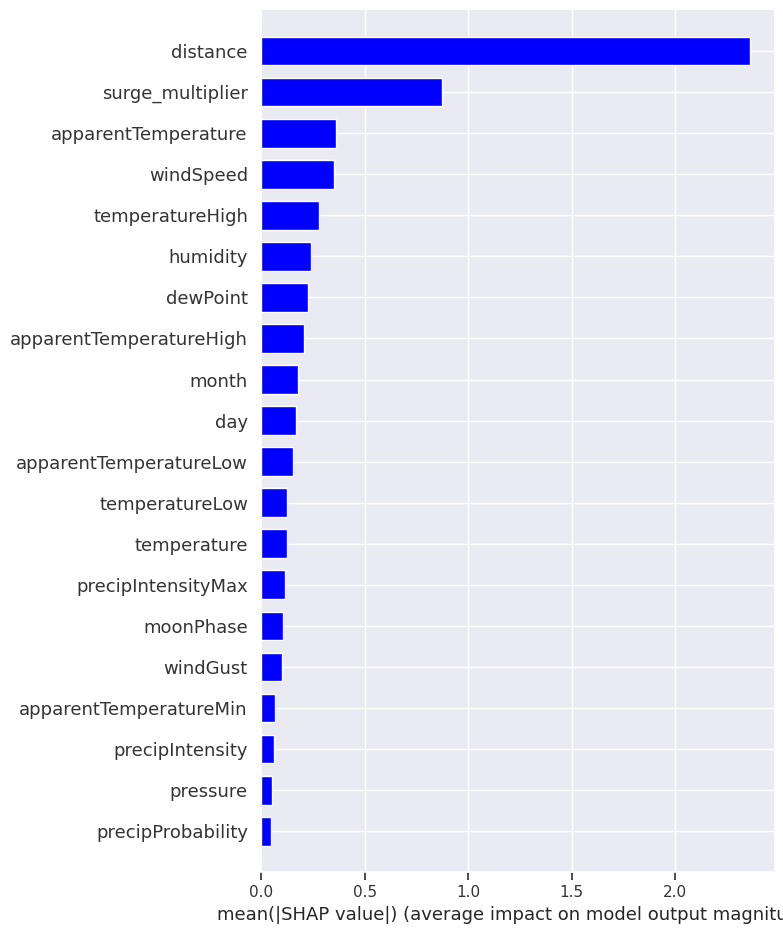

In [69]:
# SHAP variable importance for the Selected Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

#Shap Waterfall Plot
f(x) = 13.65 is what we got as a model output and the expected output for this sample was 16.56. The waterfall model explains how we got the expected output, and which features contributed to what. The blue bar shows which feature negatively contributed to the output while the red bar shows which feature positively contributed to the output

In [70]:
# Waterfall plot for linear model
def get_SHAP(index=18):
    shap.plots.waterfall(linear_shap_values[index], max_display=14)

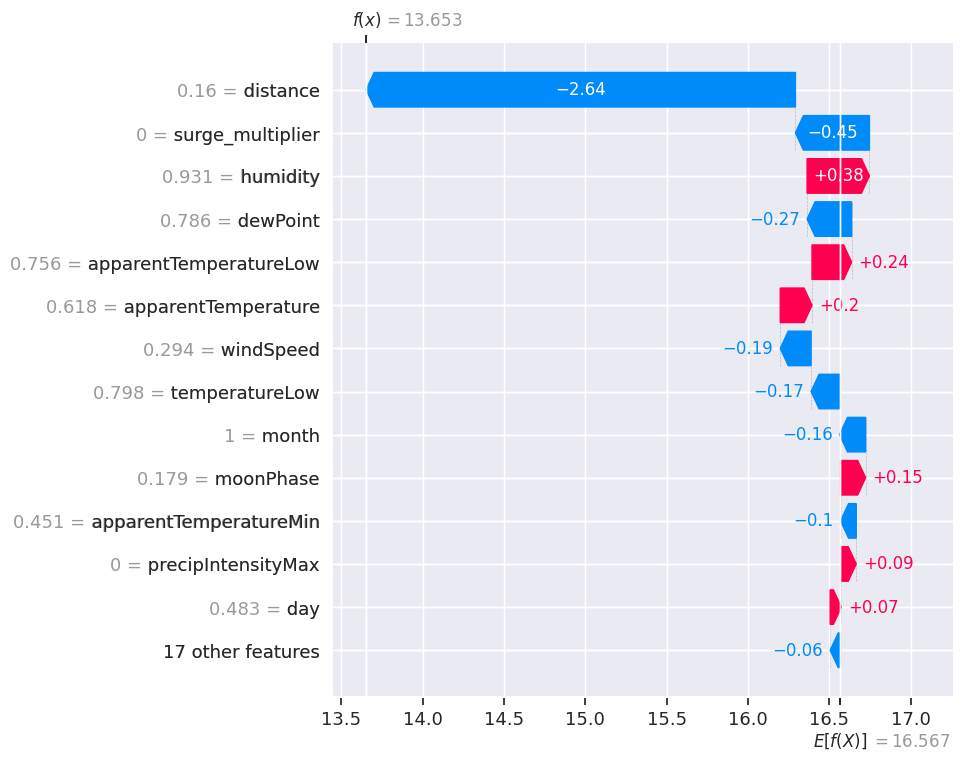

In [71]:
get_SHAP()

#Interpreting the summary plot for selected Model

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Red color dot represents high values while the blue color dot represents low value
If a dot is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
The position of a dot on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.
Let us try to understand how the features are affecting the model.

Higher value of distance tends to have a positive impact on the price of a cab ride while smaller distances have a negative impact.
A larger surge multiplier will have a incremental effect on the price of the cab 

This visualization is very useful when it comes to interpreting how our model is working.

/usr/local/lib/python3.9/dist-packages/shap/plots/_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



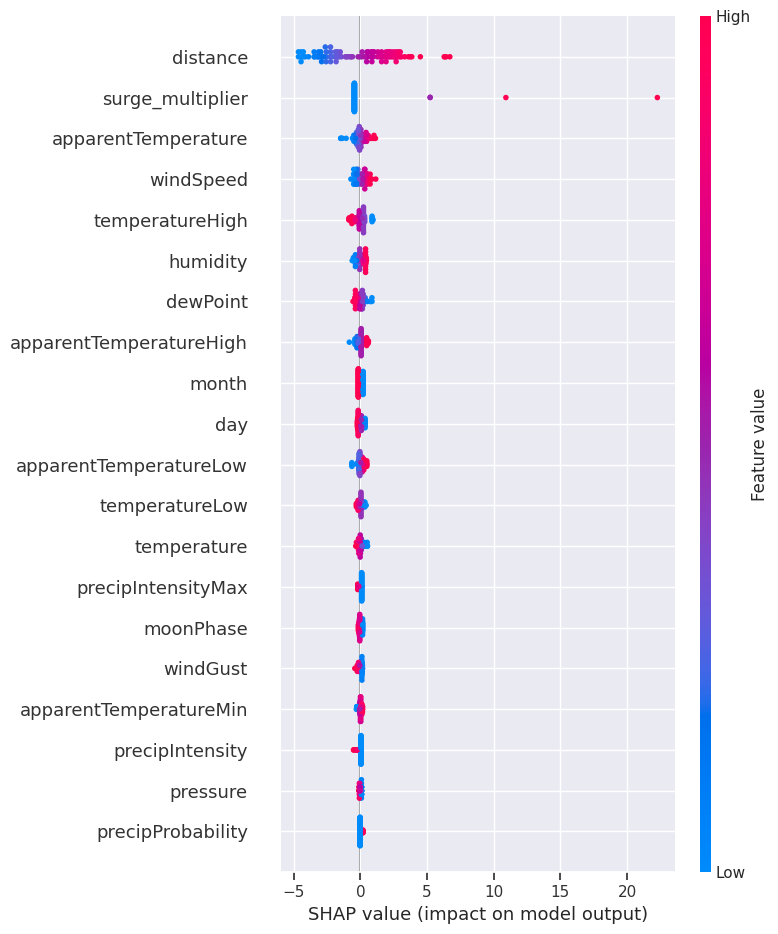

In [72]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train_100)

SHAP dependence plot

A SHAP dependence plot is a visualization tool that helps to explore the relationship between a feature and the predicted output of a machine learning model. It shows how the value of a single feature affects the predicted output, while accounting for the effects of other features in the model.

The plot consists of a scatter plot of the values of the feature on the horizontal axis and the corresponding predicted output on the vertical axis. Each point on the scatter plot represents an instance in the dataset, and the color of the point represents the value of another feature that is correlated with the feature of interest.

The plot also includes a line that represents the trend in the predicted output as the feature value increases, as well as shaded regions that represent the confidence intervals around the trend. The plot is generated using SHAP values, which provide a measure of the contribution of each feature to the predicted output for each instance.

The SHAP dependence plot can be used to explore the relationship between a single feature and the predicted output, and to identify any non-linear or complex relationships that may exist. It can also be used to identify any interactions or correlations between the feature of interest and other features in the model.

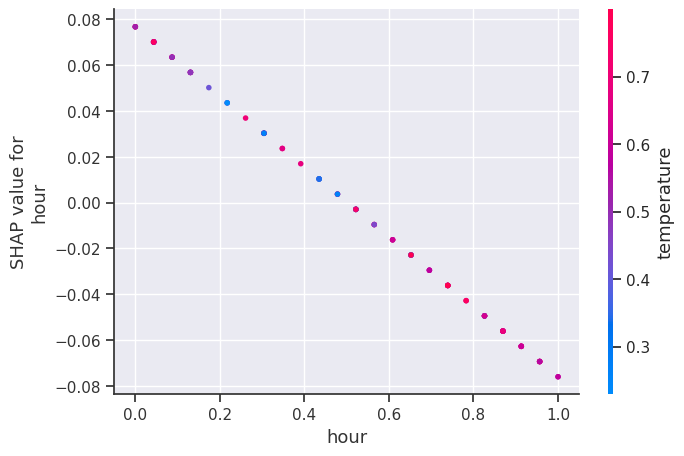

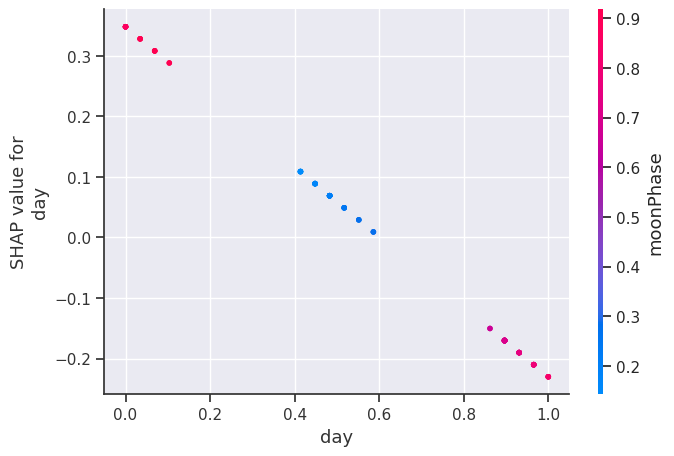

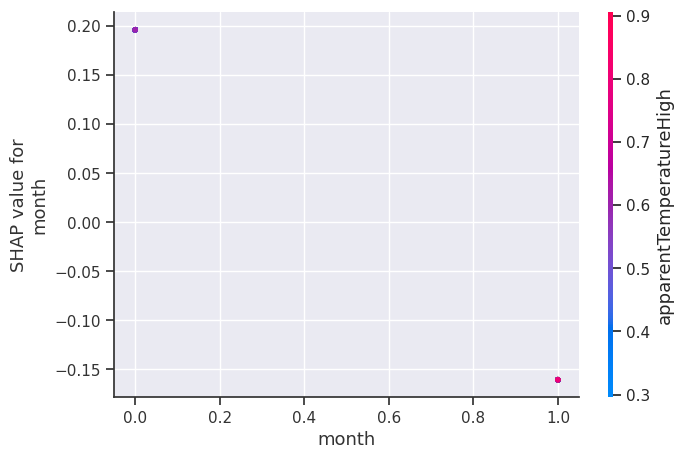

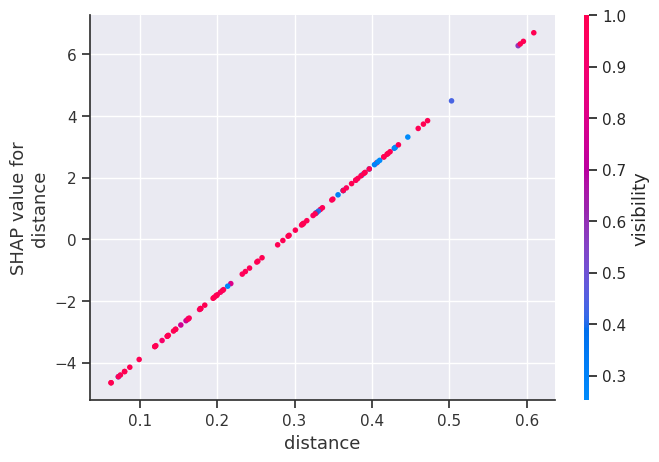

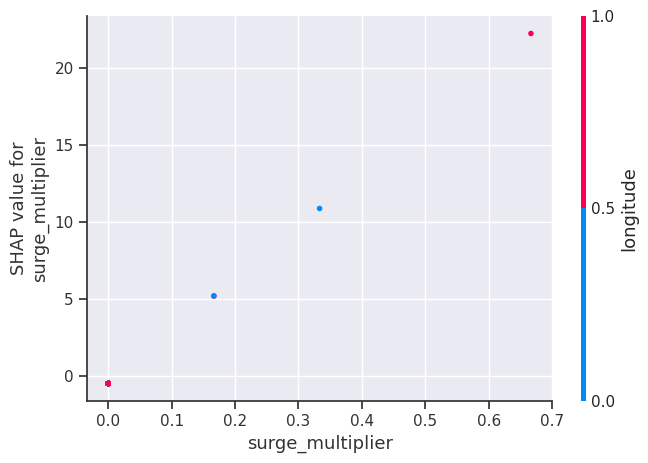

...

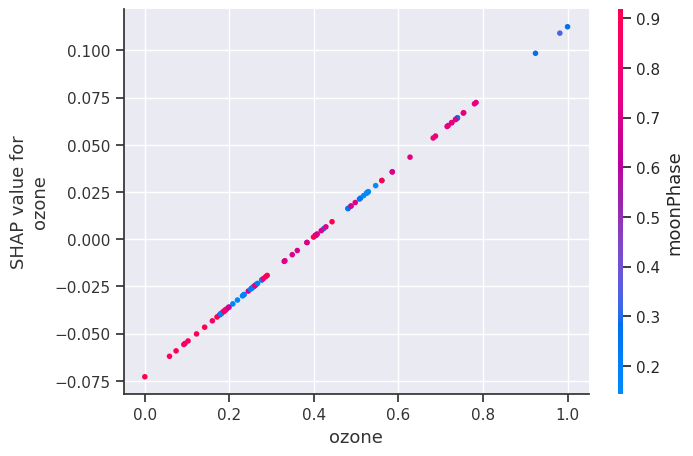

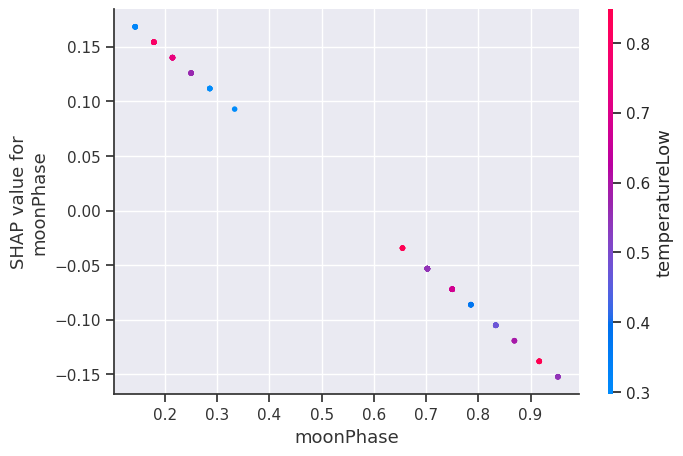

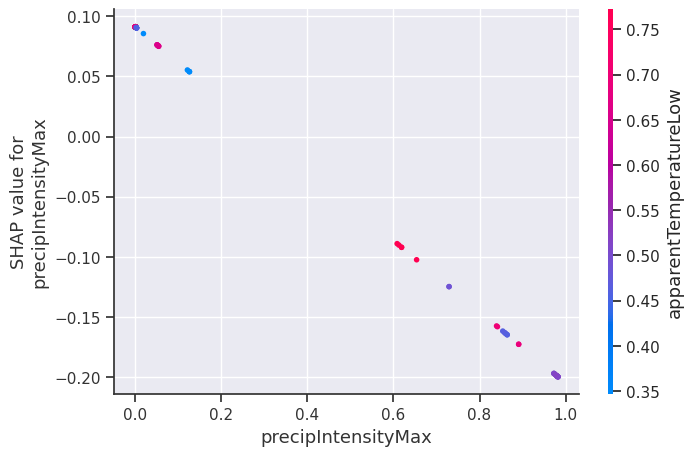

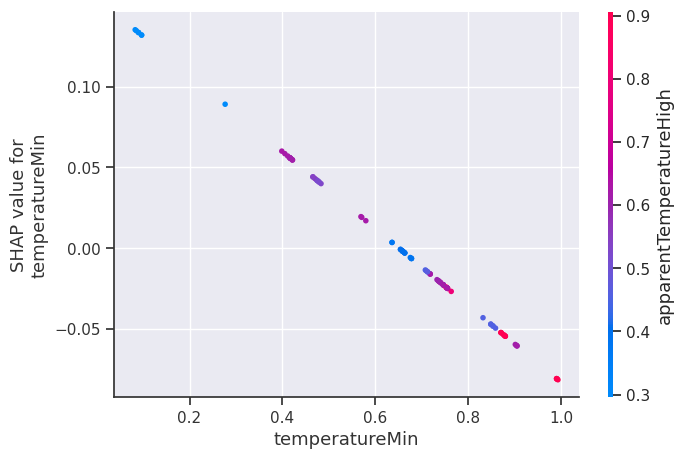

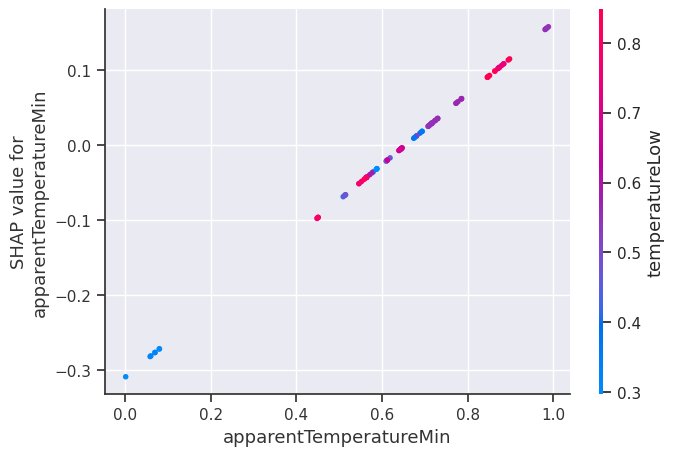

In [73]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train_100)

#Heatmap Visualization for selected model

A SHAP heatmap is a type of visualization that can be used to show the relationship between multiple features and the predicted output of a machine learning model.

The heatmap is generated using the SHAP values for each instance in the dataset and shows the magnitude and direction of the impact of each feature on the predicted output. Each row in the heatmap represents an instance in the dataset, and each column represents a feature.

The SHAP values are represented by a color scale, with red indicating a positive impact on the predicted output and blue indicating a negative impact. The intensity of the color represents the magnitude of the impact, with darker colors indicating a stronger impact.

The SHAP heatmap can be used to identify patterns and correlations between the features and the predicted output, and to identify any instances where the model is making unexpected or incorrect predictions. It can also be used to identify any instances of feature interactions, where the combined impact of two or more features is different from the sum of their individual impacts.

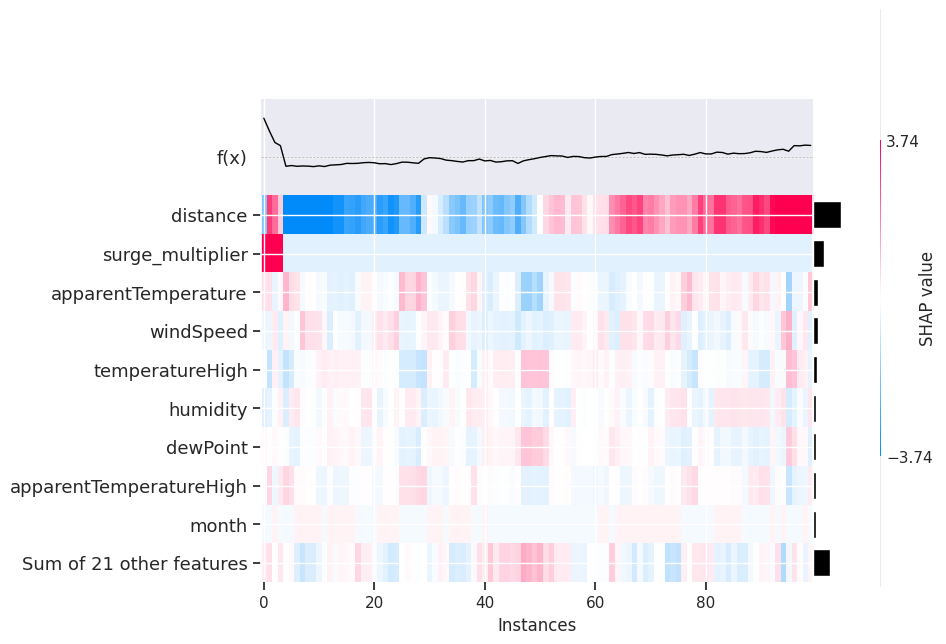

In [74]:
shap.plots.heatmap(linear_shap_values) 

SHAP feature importance plot

A SHAP feature importance plot is a visualization tool that helps to explain the relative importance of each feature in a machine learning model. It uses the SHAP values, which are a type of additive feature importance measure that assigns a value to each feature for each instance, based on how much that feature contributes to the predicted output.

The plot consists of a horizontal axis representing the magnitude of the SHAP values for each feature and a series of vertical bars representing the features sorted by their importance, with the most important feature at the top of the plot. Each bar is colored according to the value of the corresponding feature, with blue indicating low values and red indicating high values.

The plot provides a clear and intuitive way to visualize the relative importance of each feature in the model, as well as the direction and magnitude of their effects. It can be useful for identifying which features are driving the predictions and for understanding the behavior of the model. The plot can also help to identify potential issues with the model, such as overfitting or collinearity between features.

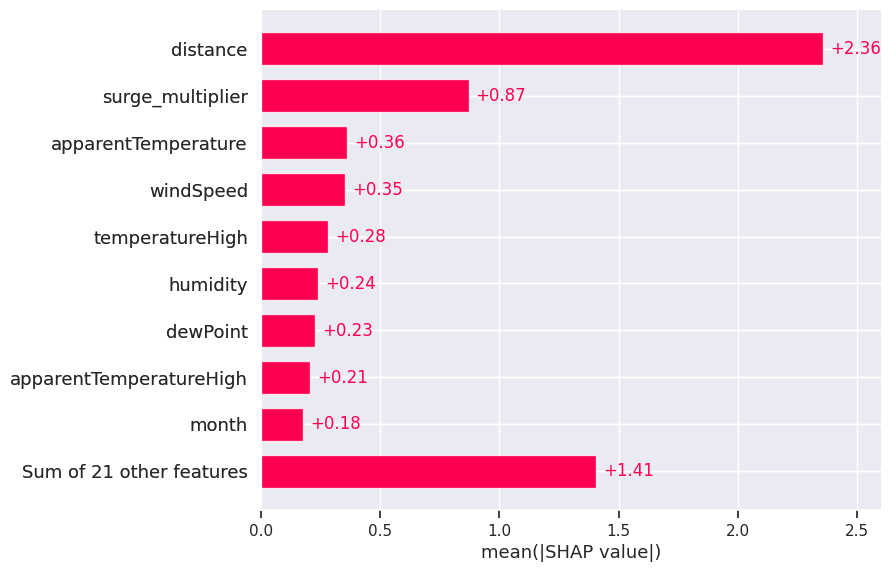

In [75]:
shap.plots.bar(linear_shap_values)

#SHAP analysis for  AutoML model

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

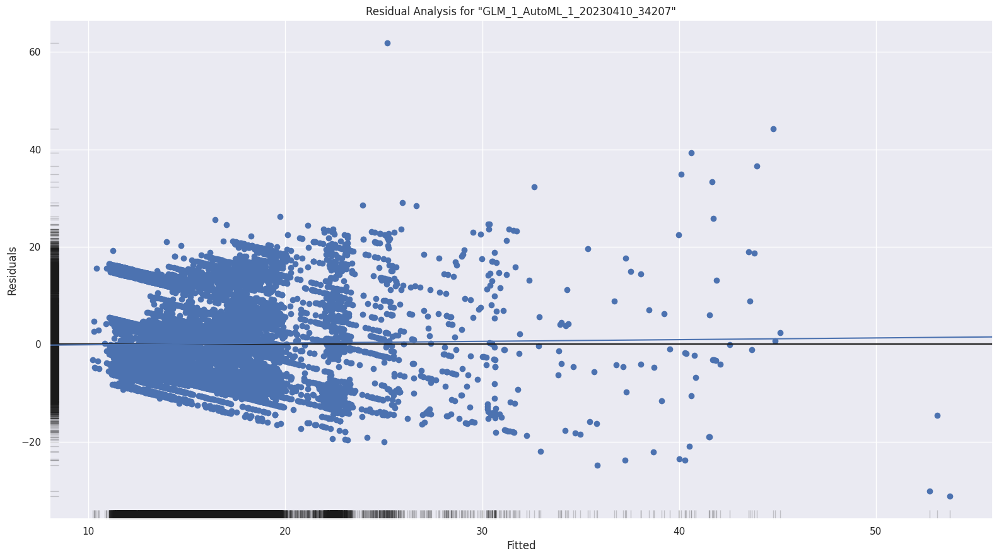

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

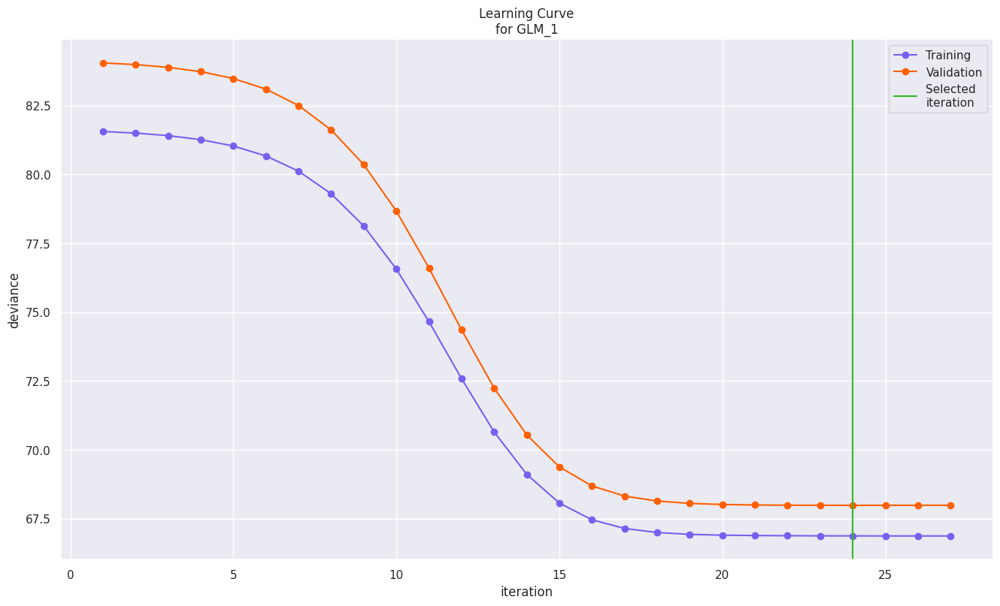

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

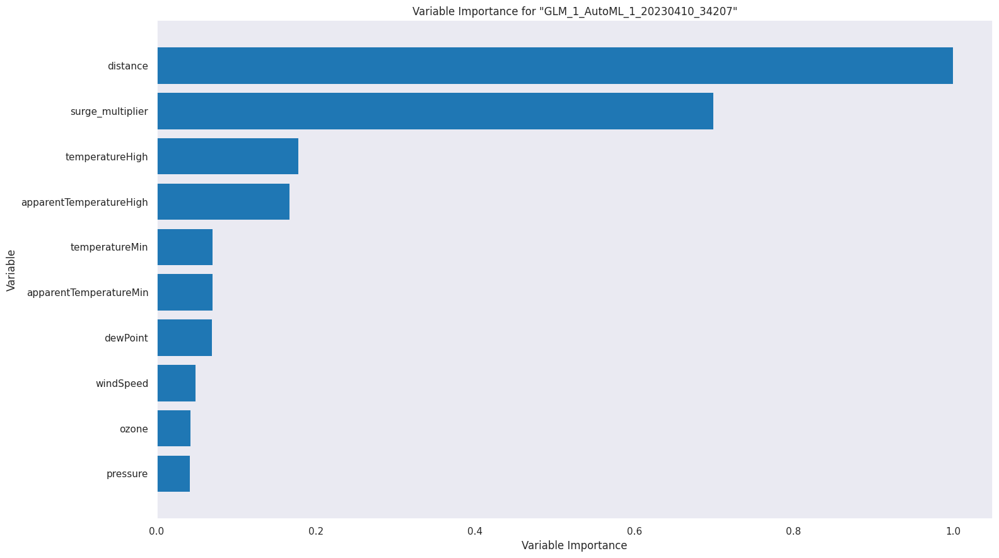

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

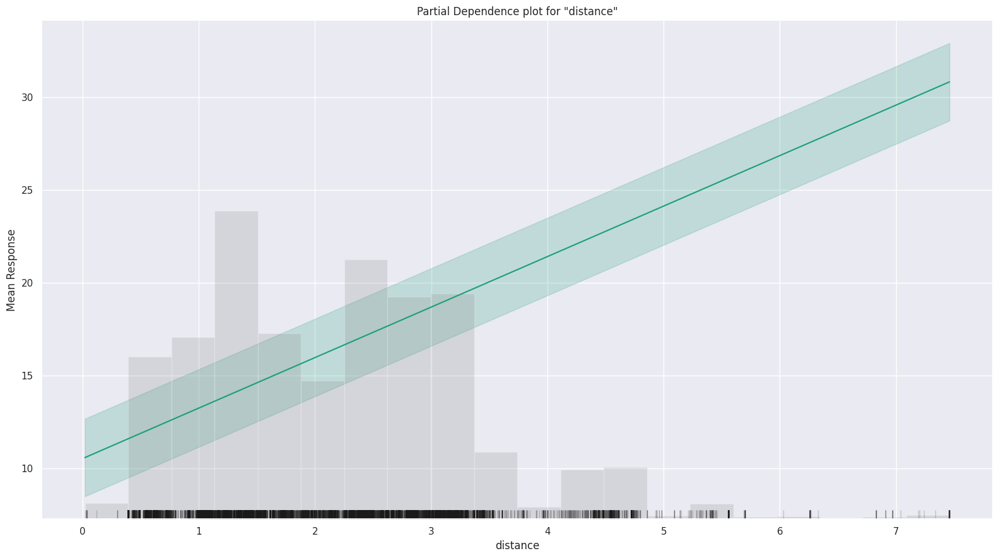

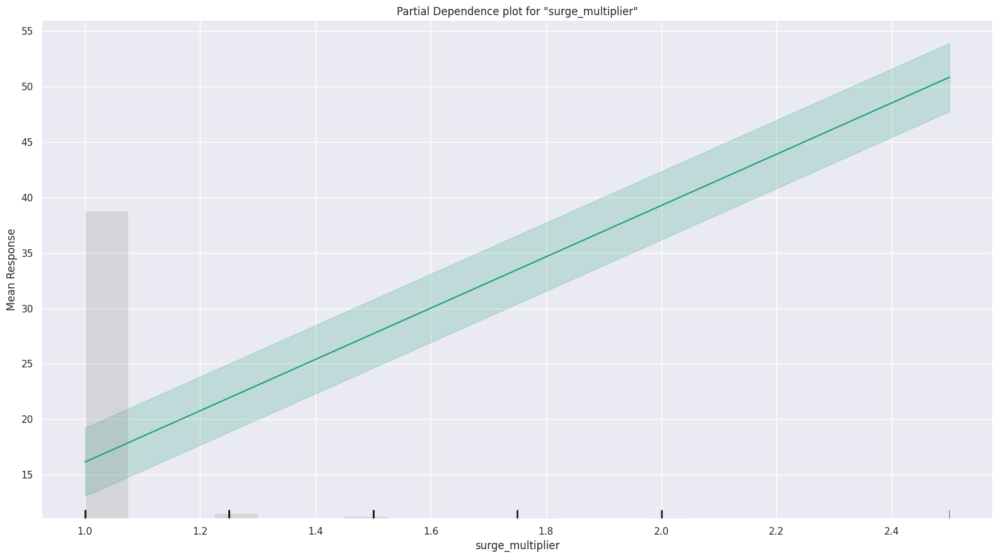

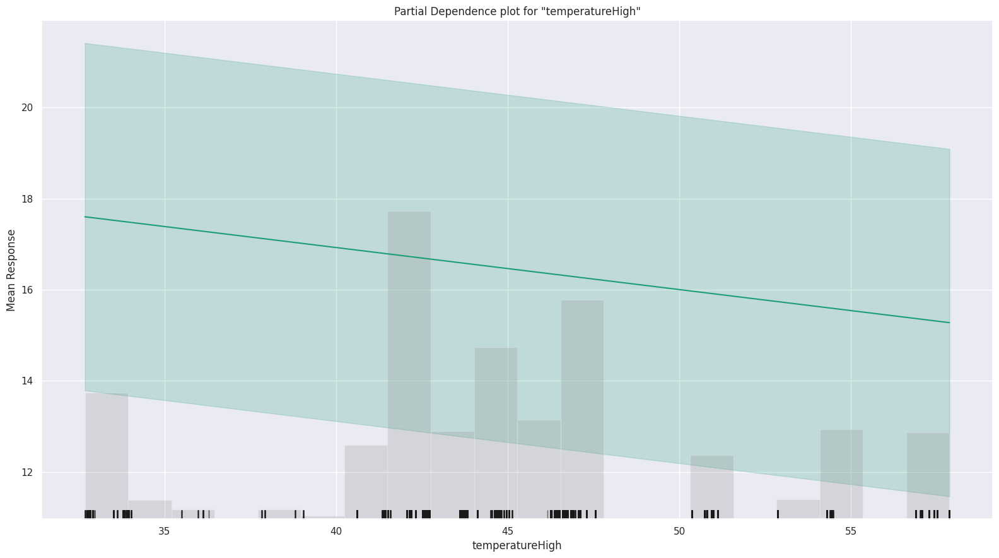

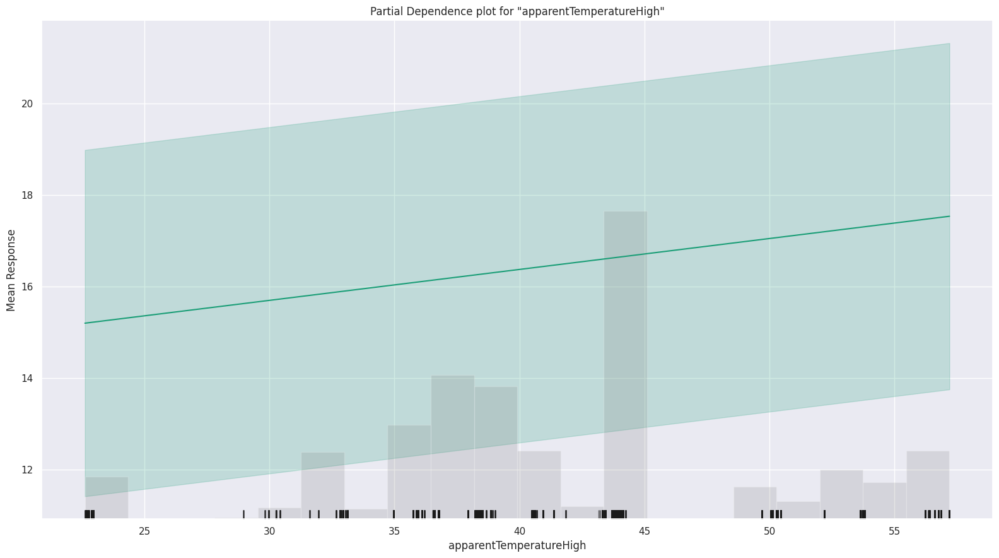

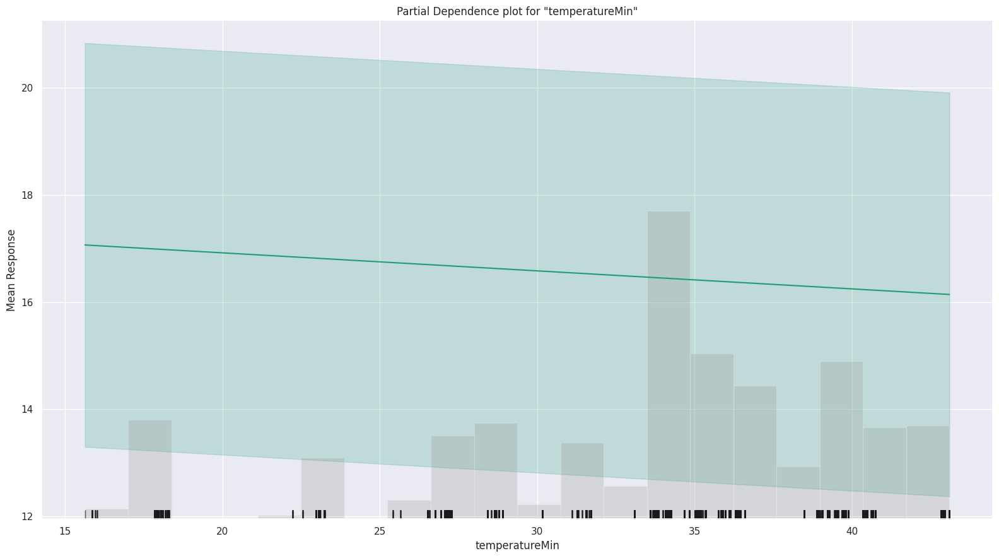

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

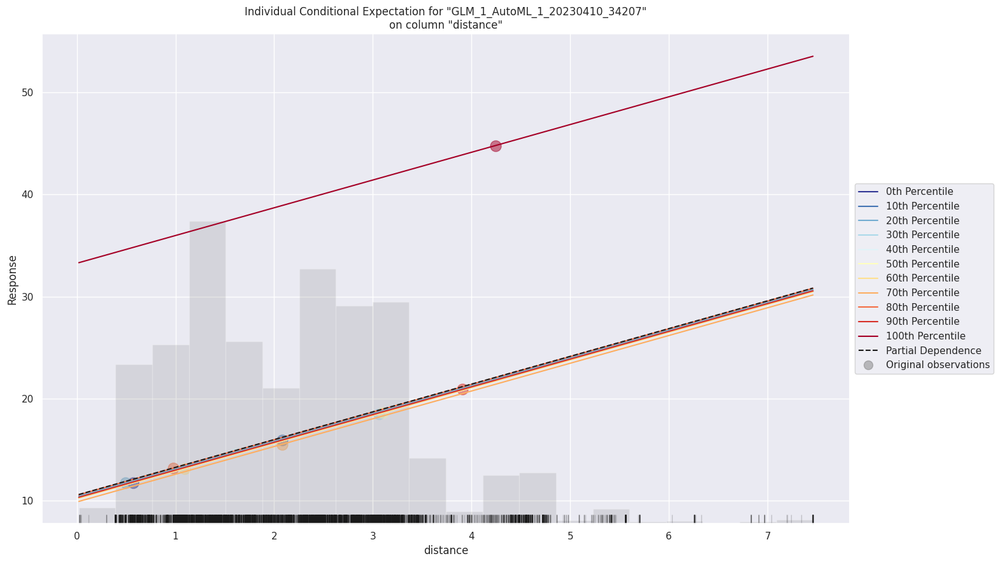

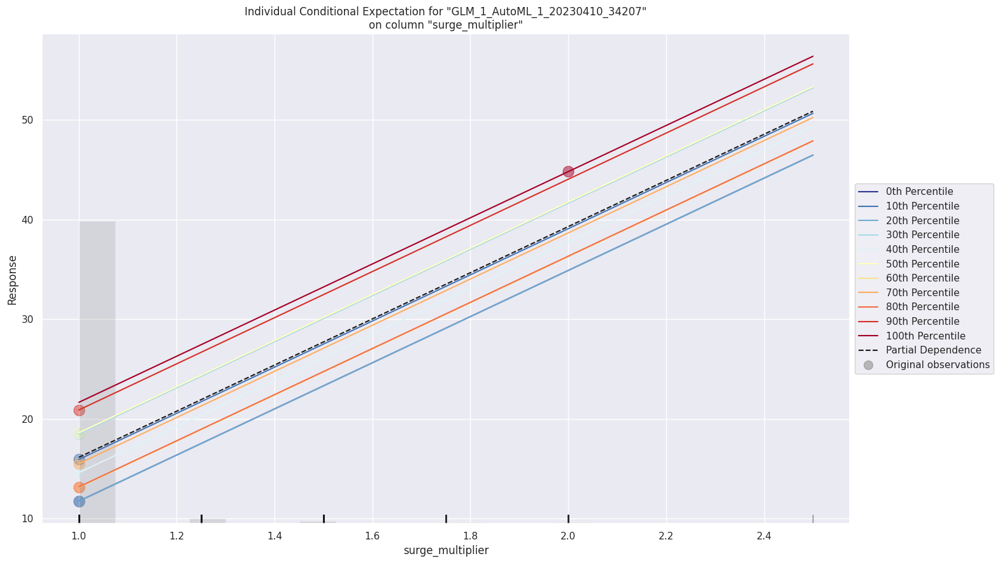

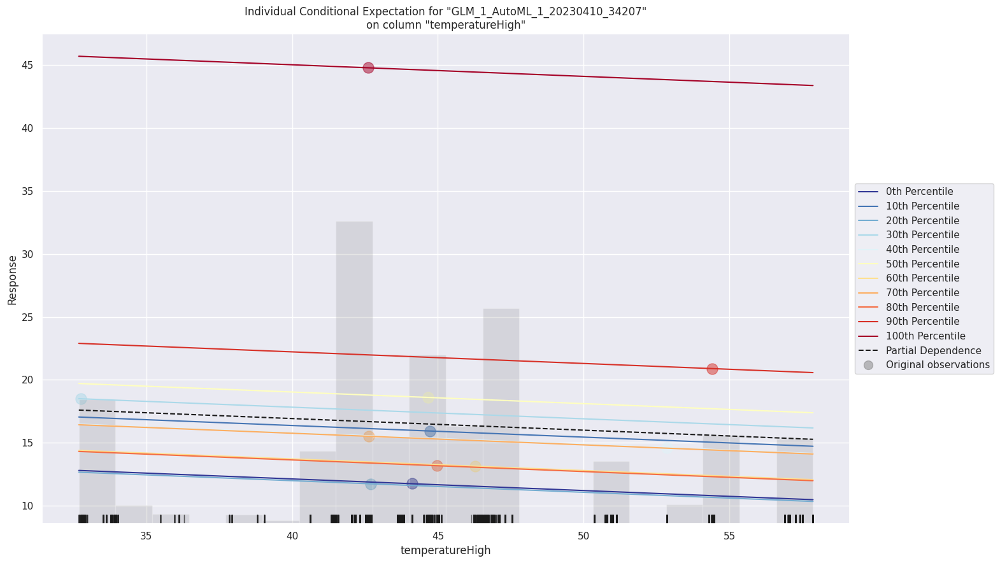

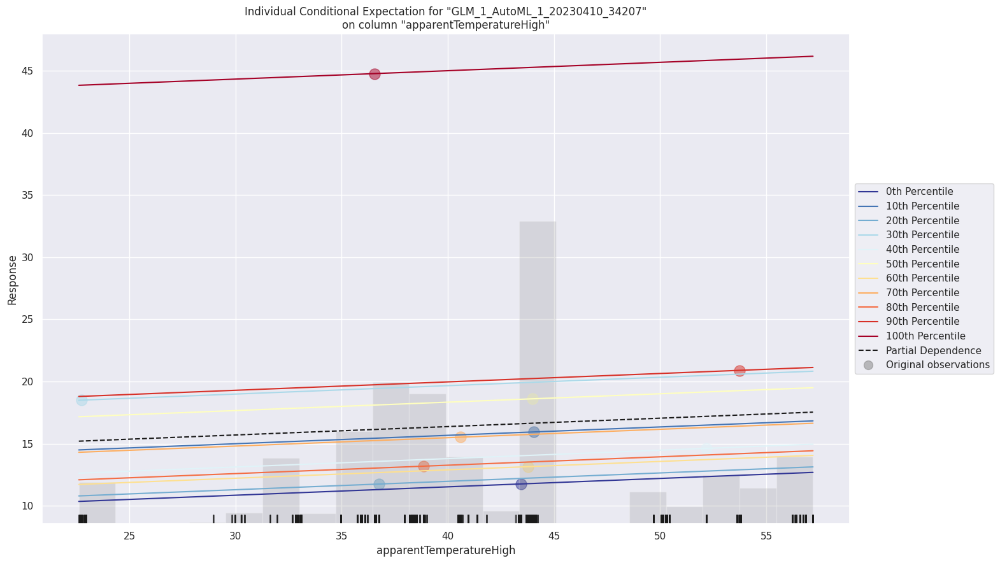

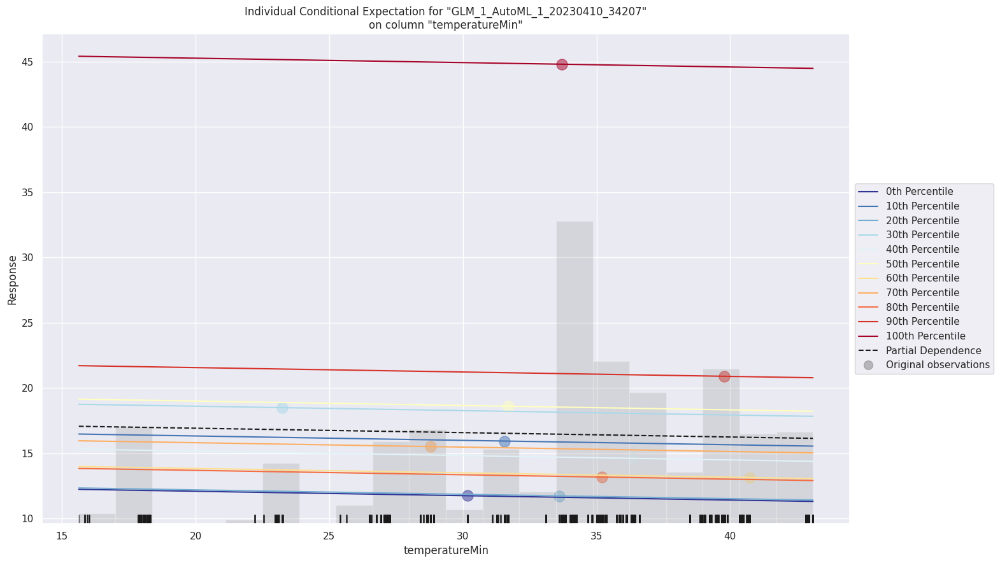

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [76]:
autoML_model.explain(autoML[1])


2. What did you do?

*   Understood the features of the dataset.
*   Understood the distribution of the features in the dataset
*   Imputed the missing values.
*   Built a Machine Learning Model(Linear and Tree based model)
*   Used AutoML to build a machine learning model in a different way
*   Hyperparameter tuning of the AutoML model
*   Used SHAP to see which feature positively and negatively affects the target variable(price)


3. How well did it work?

  From all the  above observations, we can see that there are two variables which are important in this dataset, distance and surge_multiplier. However, even after removing the insignificant features from the dataset, it had little or no impact in improving the prediction of the model as shown in the OLS regression summary. Additionally, Low r2 scores and high RMSE and MSE scores imply that the model isn't doing its job of correctly predicting the values.

4. What did you learn?

  I learned the complete lifecycle of a Data Science project starting from understanding the dataset and cleaning it to predicting the values using various Machine Learning algorithms

  Imputing missing data rather than getting rid of it as missing data could impact the prediction of the model

  Evaluation metrics such as Mean Squared Error, Root Mean Squared Error, Mean Absolute Error, Mean Residual Deviance and
Accuracy. Since it is a regression problem these are the most suitable parameters to evaluate the performance of my model.

  Using the AutoML platform as it helps in the automation of building of the machine learning model and its much more easier.

  Multiple models must be trained and the best models should be selected to be deployed, as some algorithms perform much better than the other's on specific tasks

  Model Interpretation(Unboxing the Black Blox) is the best takeaway from the series of this assignments. SHAP and LIME methods have made it easier to understand what made a model to predict a outcome.

References


1)https://www.kaggle.com/code/danielbeltsazar/uber-lyft-price-prediction

2)https://www.analyticsvidhya.com/blog/2021/09/q-q-plot-ensure-your-ml-model-is-based-on-the-right-distributions/

3)https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb

4) https://heartbeat.comet.ml/implementing-ordinary-least-squares-ols-using-statsmodels-in-python-b1f4dee09419

5) https://towardsdatascience.com/feature-selection-using-random-forest-26d7b747597f

6) https://docs.h2o.ai/h2o/latest-stable/h2o-docs/index.html

7)https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

8)https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

9)https://www.kaggle.com/datasets/brllrb/uber-and-lyft-dataset-boston-ma

#MIT License

Copyright (c) 2023 Mitesh Padam Singh

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:
The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.